# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162428.jpg  
  inflating: processed_celeba_small/celeba/162429.jpg  
  inflating: processed_celeba_small/celeba/162430.jpg  
  inflating: processed_celeba_small/celeba/162431.jpg  
  inflating: processed_celeba_small/celeba/162432.jpg  
  inflating: processed_celeba_small/celeba/162433.jpg  
  inflating: processed_celeba_small/celeba/162434.jpg  
  inflating: processed_celeba_small/celeba/162435.jpg  
  inflating: processed_celeba_small/celeba/162436.jpg  
  inflating: processed_celeba_small/celeba/162437.jpg  
  inflating: processed_celeba_small/celeba/162438.jpg  
  inflating: processed_celeba_small/celeba/162439.jpg  
  inflating: processed_celeba_small/celeba/162440.jpg  
  inflating: processed_celeba_small/celeba/162441.jpg  
  inflating: processed_celeba_small/celeba/162442.jpg  
  inflating: processed_celeba_small/celeba/162443.jpg  
  inflating: processed_celeba_small/celeba/162444.jpg  
  inflating: processed_celeba_small/celeba/16244

  inflating: processed_celeba_small/celeba/162909.jpg  
  inflating: processed_celeba_small/celeba/162910.jpg  
  inflating: processed_celeba_small/celeba/162911.jpg  
  inflating: processed_celeba_small/celeba/162912.jpg  
  inflating: processed_celeba_small/celeba/162913.jpg  
  inflating: processed_celeba_small/celeba/162914.jpg  
  inflating: processed_celeba_small/celeba/162915.jpg  
  inflating: processed_celeba_small/celeba/162916.jpg  
  inflating: processed_celeba_small/celeba/162917.jpg  
  inflating: processed_celeba_small/celeba/162918.jpg  
  inflating: processed_celeba_small/celeba/162919.jpg  
  inflating: processed_celeba_small/celeba/162920.jpg  
  inflating: processed_celeba_small/celeba/162921.jpg  
  inflating: processed_celeba_small/celeba/162922.jpg  
  inflating: processed_celeba_small/celeba/162923.jpg  
  inflating: processed_celeba_small/celeba/162924.jpg  
  inflating: processed_celeba_small/celeba/162925.jpg  
  inflating: processed_celeba_small/celeba/16292

  inflating: processed_celeba_small/celeba/163260.jpg  
  inflating: processed_celeba_small/celeba/163261.jpg  
  inflating: processed_celeba_small/celeba/163262.jpg  
  inflating: processed_celeba_small/celeba/163263.jpg  
  inflating: processed_celeba_small/celeba/163264.jpg  
  inflating: processed_celeba_small/celeba/163265.jpg  
  inflating: processed_celeba_small/celeba/163266.jpg  
  inflating: processed_celeba_small/celeba/163267.jpg  
  inflating: processed_celeba_small/celeba/163268.jpg  
  inflating: processed_celeba_small/celeba/163269.jpg  
  inflating: processed_celeba_small/celeba/163270.jpg  
  inflating: processed_celeba_small/celeba/163271.jpg  
  inflating: processed_celeba_small/celeba/163272.jpg  
  inflating: processed_celeba_small/celeba/163273.jpg  
  inflating: processed_celeba_small/celeba/163274.jpg  
  inflating: processed_celeba_small/celeba/163275.jpg  
  inflating: processed_celeba_small/celeba/163276.jpg  
  inflating: processed_celeba_small/celeba/16327

  inflating: processed_celeba_small/celeba/163770.jpg  
  inflating: processed_celeba_small/celeba/163771.jpg  
  inflating: processed_celeba_small/celeba/163772.jpg  
  inflating: processed_celeba_small/celeba/163773.jpg  
  inflating: processed_celeba_small/celeba/163774.jpg  
  inflating: processed_celeba_small/celeba/163775.jpg  
  inflating: processed_celeba_small/celeba/163776.jpg  
  inflating: processed_celeba_small/celeba/163777.jpg  
  inflating: processed_celeba_small/celeba/163778.jpg  
  inflating: processed_celeba_small/celeba/163779.jpg  
  inflating: processed_celeba_small/celeba/163780.jpg  
  inflating: processed_celeba_small/celeba/163781.jpg  
  inflating: processed_celeba_small/celeba/163782.jpg  
  inflating: processed_celeba_small/celeba/163783.jpg  
  inflating: processed_celeba_small/celeba/163784.jpg  
  inflating: processed_celeba_small/celeba/163785.jpg  
  inflating: processed_celeba_small/celeba/163786.jpg  
  inflating: processed_celeba_small/celeba/16378

  inflating: processed_celeba_small/celeba/164149.jpg  
  inflating: processed_celeba_small/celeba/164150.jpg  
  inflating: processed_celeba_small/celeba/164151.jpg  
  inflating: processed_celeba_small/celeba/164152.jpg  
  inflating: processed_celeba_small/celeba/164153.jpg  
  inflating: processed_celeba_small/celeba/164154.jpg  
  inflating: processed_celeba_small/celeba/164155.jpg  
  inflating: processed_celeba_small/celeba/164156.jpg  
  inflating: processed_celeba_small/celeba/164157.jpg  
  inflating: processed_celeba_small/celeba/164158.jpg  
  inflating: processed_celeba_small/celeba/164159.jpg  
  inflating: processed_celeba_small/celeba/164160.jpg  
  inflating: processed_celeba_small/celeba/164161.jpg  
  inflating: processed_celeba_small/celeba/164162.jpg  
  inflating: processed_celeba_small/celeba/164163.jpg  
  inflating: processed_celeba_small/celeba/164164.jpg  
  inflating: processed_celeba_small/celeba/164165.jpg  
  inflating: processed_celeba_small/celeba/16416

  inflating: processed_celeba_small/celeba/164565.jpg  
  inflating: processed_celeba_small/celeba/164566.jpg  
  inflating: processed_celeba_small/celeba/164567.jpg  
  inflating: processed_celeba_small/celeba/164568.jpg  
  inflating: processed_celeba_small/celeba/164569.jpg  
  inflating: processed_celeba_small/celeba/164570.jpg  
  inflating: processed_celeba_small/celeba/164571.jpg  
  inflating: processed_celeba_small/celeba/164572.jpg  
  inflating: processed_celeba_small/celeba/164573.jpg  
  inflating: processed_celeba_small/celeba/164574.jpg  
  inflating: processed_celeba_small/celeba/164575.jpg  
  inflating: processed_celeba_small/celeba/164576.jpg  
  inflating: processed_celeba_small/celeba/164577.jpg  
  inflating: processed_celeba_small/celeba/164578.jpg  
  inflating: processed_celeba_small/celeba/164579.jpg  
  inflating: processed_celeba_small/celeba/164580.jpg  
  inflating: processed_celeba_small/celeba/164581.jpg  
  inflating: processed_celeba_small/celeba/16458

  inflating: processed_celeba_small/celeba/165018.jpg  
  inflating: processed_celeba_small/celeba/165019.jpg  
  inflating: processed_celeba_small/celeba/165020.jpg  
  inflating: processed_celeba_small/celeba/165021.jpg  
  inflating: processed_celeba_small/celeba/165022.jpg  
  inflating: processed_celeba_small/celeba/165023.jpg  
  inflating: processed_celeba_small/celeba/165024.jpg  
  inflating: processed_celeba_small/celeba/165025.jpg  
  inflating: processed_celeba_small/celeba/165026.jpg  
  inflating: processed_celeba_small/celeba/165027.jpg  
  inflating: processed_celeba_small/celeba/165028.jpg  
  inflating: processed_celeba_small/celeba/165029.jpg  
  inflating: processed_celeba_small/celeba/165030.jpg  
  inflating: processed_celeba_small/celeba/165031.jpg  
  inflating: processed_celeba_small/celeba/165032.jpg  
  inflating: processed_celeba_small/celeba/165033.jpg  
  inflating: processed_celeba_small/celeba/165034.jpg  
  inflating: processed_celeba_small/celeba/16503

  inflating: processed_celeba_small/celeba/165456.jpg  
  inflating: processed_celeba_small/celeba/165457.jpg  
  inflating: processed_celeba_small/celeba/165458.jpg  
  inflating: processed_celeba_small/celeba/165459.jpg  
  inflating: processed_celeba_small/celeba/165460.jpg  
  inflating: processed_celeba_small/celeba/165461.jpg  
  inflating: processed_celeba_small/celeba/165462.jpg  
  inflating: processed_celeba_small/celeba/165463.jpg  
  inflating: processed_celeba_small/celeba/165464.jpg  
  inflating: processed_celeba_small/celeba/165465.jpg  
  inflating: processed_celeba_small/celeba/165466.jpg  
  inflating: processed_celeba_small/celeba/165467.jpg  
  inflating: processed_celeba_small/celeba/165468.jpg  
  inflating: processed_celeba_small/celeba/165469.jpg  
  inflating: processed_celeba_small/celeba/165470.jpg  
  inflating: processed_celeba_small/celeba/165471.jpg  
  inflating: processed_celeba_small/celeba/165472.jpg  
  inflating: processed_celeba_small/celeba/16547

  inflating: processed_celeba_small/celeba/165904.jpg  
  inflating: processed_celeba_small/celeba/165905.jpg  
  inflating: processed_celeba_small/celeba/165906.jpg  
  inflating: processed_celeba_small/celeba/165907.jpg  
  inflating: processed_celeba_small/celeba/165908.jpg  
  inflating: processed_celeba_small/celeba/165909.jpg  
  inflating: processed_celeba_small/celeba/165910.jpg  
  inflating: processed_celeba_small/celeba/165911.jpg  
  inflating: processed_celeba_small/celeba/165912.jpg  
  inflating: processed_celeba_small/celeba/165913.jpg  
  inflating: processed_celeba_small/celeba/165914.jpg  
  inflating: processed_celeba_small/celeba/165915.jpg  
  inflating: processed_celeba_small/celeba/165916.jpg  
  inflating: processed_celeba_small/celeba/165917.jpg  
  inflating: processed_celeba_small/celeba/165918.jpg  
  inflating: processed_celeba_small/celeba/165919.jpg  
  inflating: processed_celeba_small/celeba/165920.jpg  
  inflating: processed_celeba_small/celeba/16592

  inflating: processed_celeba_small/celeba/166371.jpg  
  inflating: processed_celeba_small/celeba/166372.jpg  
  inflating: processed_celeba_small/celeba/166373.jpg  
  inflating: processed_celeba_small/celeba/166374.jpg  
  inflating: processed_celeba_small/celeba/166375.jpg  
  inflating: processed_celeba_small/celeba/166376.jpg  
  inflating: processed_celeba_small/celeba/166377.jpg  
  inflating: processed_celeba_small/celeba/166378.jpg  
  inflating: processed_celeba_small/celeba/166379.jpg  
  inflating: processed_celeba_small/celeba/166380.jpg  
  inflating: processed_celeba_small/celeba/166381.jpg  
  inflating: processed_celeba_small/celeba/166382.jpg  
  inflating: processed_celeba_small/celeba/166383.jpg  
  inflating: processed_celeba_small/celeba/166384.jpg  
  inflating: processed_celeba_small/celeba/166385.jpg  
  inflating: processed_celeba_small/celeba/166386.jpg  
  inflating: processed_celeba_small/celeba/166387.jpg  
  inflating: processed_celeba_small/celeba/16638

  inflating: processed_celeba_small/celeba/166932.jpg  
  inflating: processed_celeba_small/celeba/166933.jpg  
  inflating: processed_celeba_small/celeba/166934.jpg  
  inflating: processed_celeba_small/celeba/166935.jpg  
  inflating: processed_celeba_small/celeba/166936.jpg  
  inflating: processed_celeba_small/celeba/166937.jpg  
  inflating: processed_celeba_small/celeba/166938.jpg  
  inflating: processed_celeba_small/celeba/166939.jpg  
  inflating: processed_celeba_small/celeba/166940.jpg  
  inflating: processed_celeba_small/celeba/166941.jpg  
  inflating: processed_celeba_small/celeba/166942.jpg  
  inflating: processed_celeba_small/celeba/166943.jpg  
  inflating: processed_celeba_small/celeba/166944.jpg  
  inflating: processed_celeba_small/celeba/166945.jpg  
  inflating: processed_celeba_small/celeba/166946.jpg  
  inflating: processed_celeba_small/celeba/166947.jpg  
  inflating: processed_celeba_small/celeba/166948.jpg  
  inflating: processed_celeba_small/celeba/16694

  inflating: processed_celeba_small/celeba/167287.jpg  
  inflating: processed_celeba_small/celeba/167288.jpg  
  inflating: processed_celeba_small/celeba/167289.jpg  
  inflating: processed_celeba_small/celeba/167290.jpg  
  inflating: processed_celeba_small/celeba/167291.jpg  
  inflating: processed_celeba_small/celeba/167292.jpg  
  inflating: processed_celeba_small/celeba/167293.jpg  
  inflating: processed_celeba_small/celeba/167294.jpg  
  inflating: processed_celeba_small/celeba/167295.jpg  
  inflating: processed_celeba_small/celeba/167296.jpg  
  inflating: processed_celeba_small/celeba/167297.jpg  
  inflating: processed_celeba_small/celeba/167298.jpg  
  inflating: processed_celeba_small/celeba/167299.jpg  
  inflating: processed_celeba_small/celeba/167300.jpg  
  inflating: processed_celeba_small/celeba/167301.jpg  
  inflating: processed_celeba_small/celeba/167302.jpg  
  inflating: processed_celeba_small/celeba/167303.jpg  
  inflating: processed_celeba_small/celeba/16730

  inflating: processed_celeba_small/celeba/167623.jpg  
  inflating: processed_celeba_small/celeba/167624.jpg  
  inflating: processed_celeba_small/celeba/167625.jpg  
  inflating: processed_celeba_small/celeba/167626.jpg  
  inflating: processed_celeba_small/celeba/167627.jpg  
  inflating: processed_celeba_small/celeba/167628.jpg  
  inflating: processed_celeba_small/celeba/167629.jpg  
  inflating: processed_celeba_small/celeba/167630.jpg  
  inflating: processed_celeba_small/celeba/167631.jpg  
  inflating: processed_celeba_small/celeba/167632.jpg  
  inflating: processed_celeba_small/celeba/167633.jpg  
  inflating: processed_celeba_small/celeba/167634.jpg  
  inflating: processed_celeba_small/celeba/167635.jpg  
  inflating: processed_celeba_small/celeba/167636.jpg  
  inflating: processed_celeba_small/celeba/167637.jpg  
  inflating: processed_celeba_small/celeba/167638.jpg  
  inflating: processed_celeba_small/celeba/167639.jpg  
  inflating: processed_celeba_small/celeba/16764

  inflating: processed_celeba_small/celeba/168062.jpg  
  inflating: processed_celeba_small/celeba/168063.jpg  
  inflating: processed_celeba_small/celeba/168064.jpg  
  inflating: processed_celeba_small/celeba/168065.jpg  
  inflating: processed_celeba_small/celeba/168066.jpg  
  inflating: processed_celeba_small/celeba/168067.jpg  
  inflating: processed_celeba_small/celeba/168068.jpg  
  inflating: processed_celeba_small/celeba/168069.jpg  
  inflating: processed_celeba_small/celeba/168070.jpg  
  inflating: processed_celeba_small/celeba/168071.jpg  
  inflating: processed_celeba_small/celeba/168072.jpg  
  inflating: processed_celeba_small/celeba/168073.jpg  
  inflating: processed_celeba_small/celeba/168074.jpg  
  inflating: processed_celeba_small/celeba/168075.jpg  
  inflating: processed_celeba_small/celeba/168076.jpg  
  inflating: processed_celeba_small/celeba/168077.jpg  
  inflating: processed_celeba_small/celeba/168078.jpg  
  inflating: processed_celeba_small/celeba/16807

  inflating: processed_celeba_small/celeba/168514.jpg  
  inflating: processed_celeba_small/celeba/168515.jpg  
  inflating: processed_celeba_small/celeba/168516.jpg  
  inflating: processed_celeba_small/celeba/168517.jpg  
  inflating: processed_celeba_small/celeba/168518.jpg  
  inflating: processed_celeba_small/celeba/168519.jpg  
  inflating: processed_celeba_small/celeba/168520.jpg  
  inflating: processed_celeba_small/celeba/168521.jpg  
  inflating: processed_celeba_small/celeba/168522.jpg  
  inflating: processed_celeba_small/celeba/168523.jpg  
  inflating: processed_celeba_small/celeba/168524.jpg  
  inflating: processed_celeba_small/celeba/168525.jpg  
  inflating: processed_celeba_small/celeba/168526.jpg  
  inflating: processed_celeba_small/celeba/168527.jpg  
  inflating: processed_celeba_small/celeba/168528.jpg  
  inflating: processed_celeba_small/celeba/168529.jpg  
  inflating: processed_celeba_small/celeba/168530.jpg  
  inflating: processed_celeba_small/celeba/16853

  inflating: processed_celeba_small/celeba/168752.jpg  
  inflating: processed_celeba_small/celeba/168753.jpg  
  inflating: processed_celeba_small/celeba/168754.jpg  
  inflating: processed_celeba_small/celeba/168755.jpg  
  inflating: processed_celeba_small/celeba/168756.jpg  
  inflating: processed_celeba_small/celeba/168757.jpg  
  inflating: processed_celeba_small/celeba/168758.jpg  
  inflating: processed_celeba_small/celeba/168759.jpg  
  inflating: processed_celeba_small/celeba/168760.jpg  
  inflating: processed_celeba_small/celeba/168761.jpg  
  inflating: processed_celeba_small/celeba/168762.jpg  
  inflating: processed_celeba_small/celeba/168763.jpg  
  inflating: processed_celeba_small/celeba/168764.jpg  
  inflating: processed_celeba_small/celeba/168765.jpg  
  inflating: processed_celeba_small/celeba/168766.jpg  
  inflating: processed_celeba_small/celeba/168767.jpg  
  inflating: processed_celeba_small/celeba/168768.jpg  
  inflating: processed_celeba_small/celeba/16876

  inflating: processed_celeba_small/celeba/169282.jpg  
  inflating: processed_celeba_small/celeba/169283.jpg  
  inflating: processed_celeba_small/celeba/169284.jpg  
  inflating: processed_celeba_small/celeba/169285.jpg  
  inflating: processed_celeba_small/celeba/169286.jpg  
  inflating: processed_celeba_small/celeba/169287.jpg  
  inflating: processed_celeba_small/celeba/169288.jpg  
  inflating: processed_celeba_small/celeba/169289.jpg  
  inflating: processed_celeba_small/celeba/169290.jpg  
  inflating: processed_celeba_small/celeba/169291.jpg  
  inflating: processed_celeba_small/celeba/169292.jpg  
  inflating: processed_celeba_small/celeba/169293.jpg  
  inflating: processed_celeba_small/celeba/169294.jpg  
  inflating: processed_celeba_small/celeba/169295.jpg  
  inflating: processed_celeba_small/celeba/169296.jpg  
  inflating: processed_celeba_small/celeba/169297.jpg  
  inflating: processed_celeba_small/celeba/169298.jpg  
  inflating: processed_celeba_small/celeba/16929

  inflating: processed_celeba_small/celeba/169621.jpg  
  inflating: processed_celeba_small/celeba/169622.jpg  
  inflating: processed_celeba_small/celeba/169623.jpg  
  inflating: processed_celeba_small/celeba/169624.jpg  
  inflating: processed_celeba_small/celeba/169625.jpg  
  inflating: processed_celeba_small/celeba/169626.jpg  
  inflating: processed_celeba_small/celeba/169627.jpg  
  inflating: processed_celeba_small/celeba/169628.jpg  
  inflating: processed_celeba_small/celeba/169629.jpg  
  inflating: processed_celeba_small/celeba/169630.jpg  
  inflating: processed_celeba_small/celeba/169631.jpg  
  inflating: processed_celeba_small/celeba/169632.jpg  
  inflating: processed_celeba_small/celeba/169633.jpg  
  inflating: processed_celeba_small/celeba/169634.jpg  
  inflating: processed_celeba_small/celeba/169635.jpg  
  inflating: processed_celeba_small/celeba/169636.jpg  
  inflating: processed_celeba_small/celeba/169637.jpg  
  inflating: processed_celeba_small/celeba/16963

  inflating: processed_celeba_small/celeba/170163.jpg  
  inflating: processed_celeba_small/celeba/170164.jpg  
  inflating: processed_celeba_small/celeba/170165.jpg  
  inflating: processed_celeba_small/celeba/170166.jpg  
  inflating: processed_celeba_small/celeba/170167.jpg  
  inflating: processed_celeba_small/celeba/170168.jpg  
  inflating: processed_celeba_small/celeba/170169.jpg  
  inflating: processed_celeba_small/celeba/170170.jpg  
  inflating: processed_celeba_small/celeba/170171.jpg  
  inflating: processed_celeba_small/celeba/170172.jpg  
  inflating: processed_celeba_small/celeba/170173.jpg  
  inflating: processed_celeba_small/celeba/170174.jpg  
  inflating: processed_celeba_small/celeba/170175.jpg  
  inflating: processed_celeba_small/celeba/170176.jpg  
  inflating: processed_celeba_small/celeba/170177.jpg  
  inflating: processed_celeba_small/celeba/170178.jpg  
  inflating: processed_celeba_small/celeba/170179.jpg  
  inflating: processed_celeba_small/celeba/17018

  inflating: processed_celeba_small/celeba/170522.jpg  
  inflating: processed_celeba_small/celeba/170523.jpg  
  inflating: processed_celeba_small/celeba/170524.jpg  
  inflating: processed_celeba_small/celeba/170525.jpg  
  inflating: processed_celeba_small/celeba/170526.jpg  
  inflating: processed_celeba_small/celeba/170527.jpg  
  inflating: processed_celeba_small/celeba/170528.jpg  
  inflating: processed_celeba_small/celeba/170529.jpg  
  inflating: processed_celeba_small/celeba/170530.jpg  
  inflating: processed_celeba_small/celeba/170531.jpg  
  inflating: processed_celeba_small/celeba/170532.jpg  
  inflating: processed_celeba_small/celeba/170533.jpg  
  inflating: processed_celeba_small/celeba/170534.jpg  
  inflating: processed_celeba_small/celeba/170535.jpg  
  inflating: processed_celeba_small/celeba/170536.jpg  
  inflating: processed_celeba_small/celeba/170537.jpg  
  inflating: processed_celeba_small/celeba/170538.jpg  
  inflating: processed_celeba_small/celeba/17053

  inflating: processed_celeba_small/celeba/170905.jpg  
  inflating: processed_celeba_small/celeba/170906.jpg  
  inflating: processed_celeba_small/celeba/170907.jpg  
  inflating: processed_celeba_small/celeba/170908.jpg  
  inflating: processed_celeba_small/celeba/170909.jpg  
  inflating: processed_celeba_small/celeba/170910.jpg  
  inflating: processed_celeba_small/celeba/170911.jpg  
  inflating: processed_celeba_small/celeba/170912.jpg  
  inflating: processed_celeba_small/celeba/170913.jpg  
  inflating: processed_celeba_small/celeba/170914.jpg  
  inflating: processed_celeba_small/celeba/170915.jpg  
  inflating: processed_celeba_small/celeba/170916.jpg  
  inflating: processed_celeba_small/celeba/170917.jpg  
  inflating: processed_celeba_small/celeba/170918.jpg  
  inflating: processed_celeba_small/celeba/170919.jpg  
  inflating: processed_celeba_small/celeba/170920.jpg  
  inflating: processed_celeba_small/celeba/170921.jpg  
  inflating: processed_celeba_small/celeba/17092

  inflating: processed_celeba_small/celeba/171347.jpg  
  inflating: processed_celeba_small/celeba/171348.jpg  
  inflating: processed_celeba_small/celeba/171349.jpg  
  inflating: processed_celeba_small/celeba/171350.jpg  
  inflating: processed_celeba_small/celeba/171351.jpg  
  inflating: processed_celeba_small/celeba/171352.jpg  
  inflating: processed_celeba_small/celeba/171353.jpg  
  inflating: processed_celeba_small/celeba/171354.jpg  
  inflating: processed_celeba_small/celeba/171355.jpg  
  inflating: processed_celeba_small/celeba/171356.jpg  
  inflating: processed_celeba_small/celeba/171357.jpg  
  inflating: processed_celeba_small/celeba/171358.jpg  
  inflating: processed_celeba_small/celeba/171359.jpg  
  inflating: processed_celeba_small/celeba/171360.jpg  
  inflating: processed_celeba_small/celeba/171361.jpg  
  inflating: processed_celeba_small/celeba/171362.jpg  
  inflating: processed_celeba_small/celeba/171363.jpg  
  inflating: processed_celeba_small/celeba/17136

  inflating: processed_celeba_small/celeba/171905.jpg  
  inflating: processed_celeba_small/celeba/171906.jpg  
  inflating: processed_celeba_small/celeba/171907.jpg  
  inflating: processed_celeba_small/celeba/171908.jpg  
  inflating: processed_celeba_small/celeba/171909.jpg  
  inflating: processed_celeba_small/celeba/171910.jpg  
  inflating: processed_celeba_small/celeba/171911.jpg  
  inflating: processed_celeba_small/celeba/171912.jpg  
  inflating: processed_celeba_small/celeba/171913.jpg  
  inflating: processed_celeba_small/celeba/171914.jpg  
  inflating: processed_celeba_small/celeba/171915.jpg  
  inflating: processed_celeba_small/celeba/171916.jpg  
  inflating: processed_celeba_small/celeba/171917.jpg  
  inflating: processed_celeba_small/celeba/171918.jpg  
  inflating: processed_celeba_small/celeba/171919.jpg  
  inflating: processed_celeba_small/celeba/171920.jpg  
  inflating: processed_celeba_small/celeba/171921.jpg  
  inflating: processed_celeba_small/celeba/17192

  inflating: processed_celeba_small/celeba/172267.jpg  
  inflating: processed_celeba_small/celeba/172268.jpg  
  inflating: processed_celeba_small/celeba/172269.jpg  
  inflating: processed_celeba_small/celeba/172270.jpg  
  inflating: processed_celeba_small/celeba/172271.jpg  
  inflating: processed_celeba_small/celeba/172272.jpg  
  inflating: processed_celeba_small/celeba/172273.jpg  
  inflating: processed_celeba_small/celeba/172274.jpg  
  inflating: processed_celeba_small/celeba/172275.jpg  
  inflating: processed_celeba_small/celeba/172276.jpg  
  inflating: processed_celeba_small/celeba/172277.jpg  
  inflating: processed_celeba_small/celeba/172278.jpg  
  inflating: processed_celeba_small/celeba/172279.jpg  
  inflating: processed_celeba_small/celeba/172280.jpg  
  inflating: processed_celeba_small/celeba/172281.jpg  
  inflating: processed_celeba_small/celeba/172282.jpg  
  inflating: processed_celeba_small/celeba/172283.jpg  
  inflating: processed_celeba_small/celeba/17228

  inflating: processed_celeba_small/celeba/172768.jpg  
  inflating: processed_celeba_small/celeba/172769.jpg  
  inflating: processed_celeba_small/celeba/172770.jpg  
  inflating: processed_celeba_small/celeba/172771.jpg  
  inflating: processed_celeba_small/celeba/172772.jpg  
  inflating: processed_celeba_small/celeba/172773.jpg  
  inflating: processed_celeba_small/celeba/172774.jpg  
  inflating: processed_celeba_small/celeba/172775.jpg  
  inflating: processed_celeba_small/celeba/172776.jpg  
  inflating: processed_celeba_small/celeba/172777.jpg  
  inflating: processed_celeba_small/celeba/172778.jpg  
  inflating: processed_celeba_small/celeba/172779.jpg  
  inflating: processed_celeba_small/celeba/172780.jpg  
  inflating: processed_celeba_small/celeba/172781.jpg  
  inflating: processed_celeba_small/celeba/172782.jpg  
  inflating: processed_celeba_small/celeba/172783.jpg  
  inflating: processed_celeba_small/celeba/172784.jpg  
  inflating: processed_celeba_small/celeba/17278

  inflating: processed_celeba_small/celeba/173092.jpg  
  inflating: processed_celeba_small/celeba/173093.jpg  
  inflating: processed_celeba_small/celeba/173094.jpg  
  inflating: processed_celeba_small/celeba/173095.jpg  
  inflating: processed_celeba_small/celeba/173096.jpg  
  inflating: processed_celeba_small/celeba/173097.jpg  
  inflating: processed_celeba_small/celeba/173098.jpg  
  inflating: processed_celeba_small/celeba/173099.jpg  
  inflating: processed_celeba_small/celeba/173100.jpg  
  inflating: processed_celeba_small/celeba/173101.jpg  
  inflating: processed_celeba_small/celeba/173102.jpg  
  inflating: processed_celeba_small/celeba/173103.jpg  
  inflating: processed_celeba_small/celeba/173104.jpg  
  inflating: processed_celeba_small/celeba/173105.jpg  
  inflating: processed_celeba_small/celeba/173106.jpg  
  inflating: processed_celeba_small/celeba/173107.jpg  
  inflating: processed_celeba_small/celeba/173108.jpg  
  inflating: processed_celeba_small/celeba/17310

  inflating: processed_celeba_small/celeba/173598.jpg  
  inflating: processed_celeba_small/celeba/173599.jpg  
  inflating: processed_celeba_small/celeba/173600.jpg  
  inflating: processed_celeba_small/celeba/173601.jpg  
  inflating: processed_celeba_small/celeba/173602.jpg  
  inflating: processed_celeba_small/celeba/173603.jpg  
  inflating: processed_celeba_small/celeba/173604.jpg  
  inflating: processed_celeba_small/celeba/173605.jpg  
  inflating: processed_celeba_small/celeba/173606.jpg  
  inflating: processed_celeba_small/celeba/173607.jpg  
  inflating: processed_celeba_small/celeba/173608.jpg  
  inflating: processed_celeba_small/celeba/173609.jpg  
  inflating: processed_celeba_small/celeba/173610.jpg  
  inflating: processed_celeba_small/celeba/173611.jpg  
  inflating: processed_celeba_small/celeba/173612.jpg  
  inflating: processed_celeba_small/celeba/173613.jpg  
  inflating: processed_celeba_small/celeba/173614.jpg  
  inflating: processed_celeba_small/celeba/17361

  inflating: processed_celeba_small/celeba/173870.jpg  
  inflating: processed_celeba_small/celeba/173871.jpg  
  inflating: processed_celeba_small/celeba/173872.jpg  
  inflating: processed_celeba_small/celeba/173873.jpg  
  inflating: processed_celeba_small/celeba/173874.jpg  
  inflating: processed_celeba_small/celeba/173875.jpg  
  inflating: processed_celeba_small/celeba/173876.jpg  
  inflating: processed_celeba_small/celeba/173877.jpg  
  inflating: processed_celeba_small/celeba/173878.jpg  
  inflating: processed_celeba_small/celeba/173879.jpg  
  inflating: processed_celeba_small/celeba/173880.jpg  
  inflating: processed_celeba_small/celeba/173881.jpg  
  inflating: processed_celeba_small/celeba/173882.jpg  
  inflating: processed_celeba_small/celeba/173883.jpg  
  inflating: processed_celeba_small/celeba/173884.jpg  
  inflating: processed_celeba_small/celeba/173885.jpg  
  inflating: processed_celeba_small/celeba/173886.jpg  
  inflating: processed_celeba_small/celeba/17388

  inflating: processed_celeba_small/celeba/174390.jpg  
  inflating: processed_celeba_small/celeba/174391.jpg  
  inflating: processed_celeba_small/celeba/174392.jpg  
  inflating: processed_celeba_small/celeba/174393.jpg  
  inflating: processed_celeba_small/celeba/174394.jpg  
  inflating: processed_celeba_small/celeba/174395.jpg  
  inflating: processed_celeba_small/celeba/174396.jpg  
  inflating: processed_celeba_small/celeba/174397.jpg  
  inflating: processed_celeba_small/celeba/174398.jpg  
  inflating: processed_celeba_small/celeba/174399.jpg  
  inflating: processed_celeba_small/celeba/174400.jpg  
  inflating: processed_celeba_small/celeba/174401.jpg  
  inflating: processed_celeba_small/celeba/174402.jpg  
  inflating: processed_celeba_small/celeba/174403.jpg  
  inflating: processed_celeba_small/celeba/174404.jpg  
  inflating: processed_celeba_small/celeba/174405.jpg  
  inflating: processed_celeba_small/celeba/174406.jpg  
  inflating: processed_celeba_small/celeba/17440

  inflating: processed_celeba_small/celeba/174676.jpg  
  inflating: processed_celeba_small/celeba/174677.jpg  
  inflating: processed_celeba_small/celeba/174678.jpg  
  inflating: processed_celeba_small/celeba/174679.jpg  
  inflating: processed_celeba_small/celeba/174680.jpg  
  inflating: processed_celeba_small/celeba/174681.jpg  
  inflating: processed_celeba_small/celeba/174682.jpg  
  inflating: processed_celeba_small/celeba/174683.jpg  
  inflating: processed_celeba_small/celeba/174684.jpg  
  inflating: processed_celeba_small/celeba/174685.jpg  
  inflating: processed_celeba_small/celeba/174686.jpg  
  inflating: processed_celeba_small/celeba/174687.jpg  
  inflating: processed_celeba_small/celeba/174688.jpg  
  inflating: processed_celeba_small/celeba/174689.jpg  
  inflating: processed_celeba_small/celeba/174690.jpg  
  inflating: processed_celeba_small/celeba/174691.jpg  
  inflating: processed_celeba_small/celeba/174692.jpg  
  inflating: processed_celeba_small/celeba/17469

  inflating: processed_celeba_small/celeba/175208.jpg  
  inflating: processed_celeba_small/celeba/175209.jpg  
  inflating: processed_celeba_small/celeba/175210.jpg  
  inflating: processed_celeba_small/celeba/175211.jpg  
  inflating: processed_celeba_small/celeba/175212.jpg  
  inflating: processed_celeba_small/celeba/175213.jpg  
  inflating: processed_celeba_small/celeba/175214.jpg  
  inflating: processed_celeba_small/celeba/175215.jpg  
  inflating: processed_celeba_small/celeba/175216.jpg  
  inflating: processed_celeba_small/celeba/175217.jpg  
  inflating: processed_celeba_small/celeba/175218.jpg  
  inflating: processed_celeba_small/celeba/175219.jpg  
  inflating: processed_celeba_small/celeba/175220.jpg  
  inflating: processed_celeba_small/celeba/175221.jpg  
  inflating: processed_celeba_small/celeba/175222.jpg  
  inflating: processed_celeba_small/celeba/175223.jpg  
  inflating: processed_celeba_small/celeba/175224.jpg  
  inflating: processed_celeba_small/celeba/17522

  inflating: processed_celeba_small/celeba/175513.jpg  
  inflating: processed_celeba_small/celeba/175514.jpg  
  inflating: processed_celeba_small/celeba/175515.jpg  
  inflating: processed_celeba_small/celeba/175516.jpg  
  inflating: processed_celeba_small/celeba/175517.jpg  
  inflating: processed_celeba_small/celeba/175518.jpg  
  inflating: processed_celeba_small/celeba/175519.jpg  
  inflating: processed_celeba_small/celeba/175520.jpg  
  inflating: processed_celeba_small/celeba/175521.jpg  
  inflating: processed_celeba_small/celeba/175522.jpg  
  inflating: processed_celeba_small/celeba/175523.jpg  
  inflating: processed_celeba_small/celeba/175524.jpg  
  inflating: processed_celeba_small/celeba/175525.jpg  
  inflating: processed_celeba_small/celeba/175526.jpg  
  inflating: processed_celeba_small/celeba/175527.jpg  
  inflating: processed_celeba_small/celeba/175528.jpg  
  inflating: processed_celeba_small/celeba/175529.jpg  
  inflating: processed_celeba_small/celeba/17553

  inflating: processed_celeba_small/celeba/176027.jpg  
  inflating: processed_celeba_small/celeba/176028.jpg  
  inflating: processed_celeba_small/celeba/176029.jpg  
  inflating: processed_celeba_small/celeba/176030.jpg  
  inflating: processed_celeba_small/celeba/176031.jpg  
  inflating: processed_celeba_small/celeba/176032.jpg  
  inflating: processed_celeba_small/celeba/176033.jpg  
  inflating: processed_celeba_small/celeba/176034.jpg  
  inflating: processed_celeba_small/celeba/176035.jpg  
  inflating: processed_celeba_small/celeba/176036.jpg  
  inflating: processed_celeba_small/celeba/176037.jpg  
  inflating: processed_celeba_small/celeba/176038.jpg  
  inflating: processed_celeba_small/celeba/176039.jpg  
  inflating: processed_celeba_small/celeba/176040.jpg  
  inflating: processed_celeba_small/celeba/176041.jpg  
  inflating: processed_celeba_small/celeba/176042.jpg  
  inflating: processed_celeba_small/celeba/176043.jpg  
  inflating: processed_celeba_small/celeba/17604

  inflating: processed_celeba_small/celeba/176623.jpg  
  inflating: processed_celeba_small/celeba/176624.jpg  
  inflating: processed_celeba_small/celeba/176625.jpg  
  inflating: processed_celeba_small/celeba/176626.jpg  
  inflating: processed_celeba_small/celeba/176627.jpg  
  inflating: processed_celeba_small/celeba/176628.jpg  
  inflating: processed_celeba_small/celeba/176629.jpg  
  inflating: processed_celeba_small/celeba/176630.jpg  
  inflating: processed_celeba_small/celeba/176631.jpg  
  inflating: processed_celeba_small/celeba/176632.jpg  
  inflating: processed_celeba_small/celeba/176633.jpg  
  inflating: processed_celeba_small/celeba/176634.jpg  
  inflating: processed_celeba_small/celeba/176635.jpg  
  inflating: processed_celeba_small/celeba/176636.jpg  
  inflating: processed_celeba_small/celeba/176637.jpg  
  inflating: processed_celeba_small/celeba/176638.jpg  
  inflating: processed_celeba_small/celeba/176639.jpg  
  inflating: processed_celeba_small/celeba/17664

  inflating: processed_celeba_small/celeba/176902.jpg  
  inflating: processed_celeba_small/celeba/176903.jpg  
  inflating: processed_celeba_small/celeba/176904.jpg  
  inflating: processed_celeba_small/celeba/176905.jpg  
  inflating: processed_celeba_small/celeba/176906.jpg  
  inflating: processed_celeba_small/celeba/176907.jpg  
  inflating: processed_celeba_small/celeba/176908.jpg  
  inflating: processed_celeba_small/celeba/176909.jpg  
  inflating: processed_celeba_small/celeba/176910.jpg  
  inflating: processed_celeba_small/celeba/176911.jpg  
  inflating: processed_celeba_small/celeba/176912.jpg  
  inflating: processed_celeba_small/celeba/176913.jpg  
  inflating: processed_celeba_small/celeba/176914.jpg  
  inflating: processed_celeba_small/celeba/176915.jpg  
  inflating: processed_celeba_small/celeba/176916.jpg  
  inflating: processed_celeba_small/celeba/176917.jpg  
  inflating: processed_celeba_small/celeba/176918.jpg  
  inflating: processed_celeba_small/celeba/17691

  inflating: processed_celeba_small/celeba/177464.jpg  
  inflating: processed_celeba_small/celeba/177465.jpg  
  inflating: processed_celeba_small/celeba/177466.jpg  
  inflating: processed_celeba_small/celeba/177467.jpg  
  inflating: processed_celeba_small/celeba/177468.jpg  
  inflating: processed_celeba_small/celeba/177469.jpg  
  inflating: processed_celeba_small/celeba/177470.jpg  
  inflating: processed_celeba_small/celeba/177471.jpg  
  inflating: processed_celeba_small/celeba/177472.jpg  
  inflating: processed_celeba_small/celeba/177473.jpg  
  inflating: processed_celeba_small/celeba/177474.jpg  
  inflating: processed_celeba_small/celeba/177475.jpg  
  inflating: processed_celeba_small/celeba/177476.jpg  
  inflating: processed_celeba_small/celeba/177477.jpg  
  inflating: processed_celeba_small/celeba/177478.jpg  
  inflating: processed_celeba_small/celeba/177479.jpg  
  inflating: processed_celeba_small/celeba/177480.jpg  
  inflating: processed_celeba_small/celeba/17748

  inflating: processed_celeba_small/celeba/177767.jpg  
  inflating: processed_celeba_small/celeba/177768.jpg  
  inflating: processed_celeba_small/celeba/177769.jpg  
  inflating: processed_celeba_small/celeba/177770.jpg  
  inflating: processed_celeba_small/celeba/177771.jpg  
  inflating: processed_celeba_small/celeba/177772.jpg  
  inflating: processed_celeba_small/celeba/177773.jpg  
  inflating: processed_celeba_small/celeba/177774.jpg  
  inflating: processed_celeba_small/celeba/177775.jpg  
  inflating: processed_celeba_small/celeba/177776.jpg  
  inflating: processed_celeba_small/celeba/177777.jpg  
  inflating: processed_celeba_small/celeba/177778.jpg  
  inflating: processed_celeba_small/celeba/177779.jpg  
  inflating: processed_celeba_small/celeba/177780.jpg  
  inflating: processed_celeba_small/celeba/177781.jpg  
  inflating: processed_celeba_small/celeba/177782.jpg  
  inflating: processed_celeba_small/celeba/177783.jpg  
  inflating: processed_celeba_small/celeba/17778

  inflating: processed_celeba_small/celeba/178325.jpg  
  inflating: processed_celeba_small/celeba/178326.jpg  
  inflating: processed_celeba_small/celeba/178327.jpg  
  inflating: processed_celeba_small/celeba/178328.jpg  
  inflating: processed_celeba_small/celeba/178329.jpg  
  inflating: processed_celeba_small/celeba/178330.jpg  
  inflating: processed_celeba_small/celeba/178331.jpg  
  inflating: processed_celeba_small/celeba/178332.jpg  
  inflating: processed_celeba_small/celeba/178333.jpg  
  inflating: processed_celeba_small/celeba/178334.jpg  
  inflating: processed_celeba_small/celeba/178335.jpg  
  inflating: processed_celeba_small/celeba/178336.jpg  
  inflating: processed_celeba_small/celeba/178337.jpg  
  inflating: processed_celeba_small/celeba/178338.jpg  
  inflating: processed_celeba_small/celeba/178339.jpg  
  inflating: processed_celeba_small/celeba/178340.jpg  
  inflating: processed_celeba_small/celeba/178341.jpg  
  inflating: processed_celeba_small/celeba/17834

  inflating: processed_celeba_small/celeba/178561.jpg  
  inflating: processed_celeba_small/celeba/178562.jpg  
  inflating: processed_celeba_small/celeba/178563.jpg  
  inflating: processed_celeba_small/celeba/178564.jpg  
  inflating: processed_celeba_small/celeba/178565.jpg  
  inflating: processed_celeba_small/celeba/178566.jpg  
  inflating: processed_celeba_small/celeba/178567.jpg  
  inflating: processed_celeba_small/celeba/178568.jpg  
  inflating: processed_celeba_small/celeba/178569.jpg  
  inflating: processed_celeba_small/celeba/178570.jpg  
  inflating: processed_celeba_small/celeba/178571.jpg  
  inflating: processed_celeba_small/celeba/178572.jpg  
  inflating: processed_celeba_small/celeba/178573.jpg  
  inflating: processed_celeba_small/celeba/178574.jpg  
  inflating: processed_celeba_small/celeba/178575.jpg  
  inflating: processed_celeba_small/celeba/178576.jpg  
  inflating: processed_celeba_small/celeba/178577.jpg  
  inflating: processed_celeba_small/celeba/17857

  inflating: processed_celeba_small/celeba/178909.jpg  
  inflating: processed_celeba_small/celeba/178910.jpg  
  inflating: processed_celeba_small/celeba/178911.jpg  
  inflating: processed_celeba_small/celeba/178912.jpg  
  inflating: processed_celeba_small/celeba/178913.jpg  
  inflating: processed_celeba_small/celeba/178914.jpg  
  inflating: processed_celeba_small/celeba/178915.jpg  
  inflating: processed_celeba_small/celeba/178916.jpg  
  inflating: processed_celeba_small/celeba/178917.jpg  
  inflating: processed_celeba_small/celeba/178918.jpg  
  inflating: processed_celeba_small/celeba/178919.jpg  
  inflating: processed_celeba_small/celeba/178920.jpg  
  inflating: processed_celeba_small/celeba/178921.jpg  
  inflating: processed_celeba_small/celeba/178922.jpg  
  inflating: processed_celeba_small/celeba/178923.jpg  
  inflating: processed_celeba_small/celeba/178924.jpg  
  inflating: processed_celeba_small/celeba/178925.jpg  
  inflating: processed_celeba_small/celeba/17892

  inflating: processed_celeba_small/celeba/179371.jpg  
  inflating: processed_celeba_small/celeba/179372.jpg  
  inflating: processed_celeba_small/celeba/179373.jpg  
  inflating: processed_celeba_small/celeba/179374.jpg  
  inflating: processed_celeba_small/celeba/179375.jpg  
  inflating: processed_celeba_small/celeba/179376.jpg  
  inflating: processed_celeba_small/celeba/179377.jpg  
  inflating: processed_celeba_small/celeba/179378.jpg  
  inflating: processed_celeba_small/celeba/179379.jpg  
  inflating: processed_celeba_small/celeba/179380.jpg  
  inflating: processed_celeba_small/celeba/179381.jpg  
  inflating: processed_celeba_small/celeba/179382.jpg  
  inflating: processed_celeba_small/celeba/179383.jpg  
  inflating: processed_celeba_small/celeba/179384.jpg  
  inflating: processed_celeba_small/celeba/179385.jpg  
  inflating: processed_celeba_small/celeba/179386.jpg  
  inflating: processed_celeba_small/celeba/179387.jpg  
  inflating: processed_celeba_small/celeba/17938

  inflating: processed_celeba_small/celeba/179829.jpg  
  inflating: processed_celeba_small/celeba/179830.jpg  
  inflating: processed_celeba_small/celeba/179831.jpg  
  inflating: processed_celeba_small/celeba/179832.jpg  
  inflating: processed_celeba_small/celeba/179833.jpg  
  inflating: processed_celeba_small/celeba/179834.jpg  
  inflating: processed_celeba_small/celeba/179835.jpg  
  inflating: processed_celeba_small/celeba/179836.jpg  
  inflating: processed_celeba_small/celeba/179837.jpg  
  inflating: processed_celeba_small/celeba/179838.jpg  
  inflating: processed_celeba_small/celeba/179839.jpg  
  inflating: processed_celeba_small/celeba/179840.jpg  
  inflating: processed_celeba_small/celeba/179841.jpg  
  inflating: processed_celeba_small/celeba/179842.jpg  
  inflating: processed_celeba_small/celeba/179843.jpg  
  inflating: processed_celeba_small/celeba/179844.jpg  
  inflating: processed_celeba_small/celeba/179845.jpg  
  inflating: processed_celeba_small/celeba/17984

  inflating: processed_celeba_small/celeba/179997.jpg  
  inflating: processed_celeba_small/celeba/179998.jpg  
  inflating: processed_celeba_small/celeba/179999.jpg  
  inflating: processed_celeba_small/celeba/180000.jpg  
  inflating: processed_celeba_small/celeba/180001.jpg  
  inflating: processed_celeba_small/celeba/180002.jpg  
  inflating: processed_celeba_small/celeba/180003.jpg  
  inflating: processed_celeba_small/celeba/180004.jpg  
  inflating: processed_celeba_small/celeba/180005.jpg  
  inflating: processed_celeba_small/celeba/180006.jpg  
  inflating: processed_celeba_small/celeba/180007.jpg  
  inflating: processed_celeba_small/celeba/180008.jpg  
  inflating: processed_celeba_small/celeba/180009.jpg  
  inflating: processed_celeba_small/celeba/180010.jpg  
  inflating: processed_celeba_small/celeba/180011.jpg  
  inflating: processed_celeba_small/celeba/180012.jpg  
  inflating: processed_celeba_small/celeba/180013.jpg  
  inflating: processed_celeba_small/celeba/18001

  inflating: processed_celeba_small/celeba/180493.jpg  
  inflating: processed_celeba_small/celeba/180494.jpg  
  inflating: processed_celeba_small/celeba/180495.jpg  
  inflating: processed_celeba_small/celeba/180496.jpg  
  inflating: processed_celeba_small/celeba/180497.jpg  
  inflating: processed_celeba_small/celeba/180498.jpg  
  inflating: processed_celeba_small/celeba/180499.jpg  
  inflating: processed_celeba_small/celeba/180500.jpg  
  inflating: processed_celeba_small/celeba/180501.jpg  
  inflating: processed_celeba_small/celeba/180502.jpg  
  inflating: processed_celeba_small/celeba/180503.jpg  
  inflating: processed_celeba_small/celeba/180504.jpg  
  inflating: processed_celeba_small/celeba/180505.jpg  
  inflating: processed_celeba_small/celeba/180506.jpg  
  inflating: processed_celeba_small/celeba/180507.jpg  
  inflating: processed_celeba_small/celeba/180508.jpg  
  inflating: processed_celeba_small/celeba/180509.jpg  
  inflating: processed_celeba_small/celeba/18051

  inflating: processed_celeba_small/celeba/180760.jpg  
  inflating: processed_celeba_small/celeba/180761.jpg  
  inflating: processed_celeba_small/celeba/180762.jpg  
  inflating: processed_celeba_small/celeba/180763.jpg  
  inflating: processed_celeba_small/celeba/180764.jpg  
  inflating: processed_celeba_small/celeba/180765.jpg  
  inflating: processed_celeba_small/celeba/180766.jpg  
  inflating: processed_celeba_small/celeba/180767.jpg  
  inflating: processed_celeba_small/celeba/180768.jpg  
  inflating: processed_celeba_small/celeba/180769.jpg  
  inflating: processed_celeba_small/celeba/180770.jpg  
  inflating: processed_celeba_small/celeba/180771.jpg  
  inflating: processed_celeba_small/celeba/180772.jpg  
  inflating: processed_celeba_small/celeba/180773.jpg  
  inflating: processed_celeba_small/celeba/180774.jpg  
  inflating: processed_celeba_small/celeba/180775.jpg  
  inflating: processed_celeba_small/celeba/180776.jpg  
  inflating: processed_celeba_small/celeba/18077

  inflating: processed_celeba_small/celeba/181307.jpg  
  inflating: processed_celeba_small/celeba/181308.jpg  
  inflating: processed_celeba_small/celeba/181309.jpg  
  inflating: processed_celeba_small/celeba/181310.jpg  
  inflating: processed_celeba_small/celeba/181311.jpg  
  inflating: processed_celeba_small/celeba/181312.jpg  
  inflating: processed_celeba_small/celeba/181313.jpg  
  inflating: processed_celeba_small/celeba/181314.jpg  
  inflating: processed_celeba_small/celeba/181315.jpg  
  inflating: processed_celeba_small/celeba/181316.jpg  
  inflating: processed_celeba_small/celeba/181317.jpg  
  inflating: processed_celeba_small/celeba/181318.jpg  
  inflating: processed_celeba_small/celeba/181319.jpg  
  inflating: processed_celeba_small/celeba/181320.jpg  
  inflating: processed_celeba_small/celeba/181321.jpg  
  inflating: processed_celeba_small/celeba/181322.jpg  
  inflating: processed_celeba_small/celeba/181323.jpg  
  inflating: processed_celeba_small/celeba/18132

  inflating: processed_celeba_small/celeba/181573.jpg  
  inflating: processed_celeba_small/celeba/181574.jpg  
  inflating: processed_celeba_small/celeba/181575.jpg  
  inflating: processed_celeba_small/celeba/181576.jpg  
  inflating: processed_celeba_small/celeba/181577.jpg  
  inflating: processed_celeba_small/celeba/181578.jpg  
  inflating: processed_celeba_small/celeba/181579.jpg  
  inflating: processed_celeba_small/celeba/181580.jpg  
  inflating: processed_celeba_small/celeba/181581.jpg  
  inflating: processed_celeba_small/celeba/181582.jpg  
  inflating: processed_celeba_small/celeba/181583.jpg  
  inflating: processed_celeba_small/celeba/181584.jpg  
  inflating: processed_celeba_small/celeba/181585.jpg  
  inflating: processed_celeba_small/celeba/181586.jpg  
  inflating: processed_celeba_small/celeba/181587.jpg  
  inflating: processed_celeba_small/celeba/181588.jpg  
  inflating: processed_celeba_small/celeba/181589.jpg  
  inflating: processed_celeba_small/celeba/18159

  inflating: processed_celeba_small/celeba/182128.jpg  
  inflating: processed_celeba_small/celeba/182129.jpg  
  inflating: processed_celeba_small/celeba/182130.jpg  
  inflating: processed_celeba_small/celeba/182131.jpg  
  inflating: processed_celeba_small/celeba/182132.jpg  
  inflating: processed_celeba_small/celeba/182133.jpg  
  inflating: processed_celeba_small/celeba/182134.jpg  
  inflating: processed_celeba_small/celeba/182135.jpg  
  inflating: processed_celeba_small/celeba/182136.jpg  
  inflating: processed_celeba_small/celeba/182137.jpg  
  inflating: processed_celeba_small/celeba/182138.jpg  
  inflating: processed_celeba_small/celeba/182139.jpg  
  inflating: processed_celeba_small/celeba/182140.jpg  
  inflating: processed_celeba_small/celeba/182141.jpg  
  inflating: processed_celeba_small/celeba/182142.jpg  
  inflating: processed_celeba_small/celeba/182143.jpg  
  inflating: processed_celeba_small/celeba/182144.jpg  
  inflating: processed_celeba_small/celeba/18214

  inflating: processed_celeba_small/celeba/182399.jpg  
  inflating: processed_celeba_small/celeba/182400.jpg  
  inflating: processed_celeba_small/celeba/182401.jpg  
  inflating: processed_celeba_small/celeba/182402.jpg  
  inflating: processed_celeba_small/celeba/182403.jpg  
  inflating: processed_celeba_small/celeba/182404.jpg  
  inflating: processed_celeba_small/celeba/182405.jpg  
  inflating: processed_celeba_small/celeba/182406.jpg  
  inflating: processed_celeba_small/celeba/182407.jpg  
  inflating: processed_celeba_small/celeba/182408.jpg  
  inflating: processed_celeba_small/celeba/182409.jpg  
  inflating: processed_celeba_small/celeba/182410.jpg  
  inflating: processed_celeba_small/celeba/182411.jpg  
  inflating: processed_celeba_small/celeba/182412.jpg  
  inflating: processed_celeba_small/celeba/182413.jpg  
  inflating: processed_celeba_small/celeba/182414.jpg  
  inflating: processed_celeba_small/celeba/182415.jpg  
  inflating: processed_celeba_small/celeba/18241

  inflating: processed_celeba_small/celeba/182954.jpg  
  inflating: processed_celeba_small/celeba/182955.jpg  
  inflating: processed_celeba_small/celeba/182956.jpg  
  inflating: processed_celeba_small/celeba/182957.jpg  
  inflating: processed_celeba_small/celeba/182958.jpg  
  inflating: processed_celeba_small/celeba/182959.jpg  
  inflating: processed_celeba_small/celeba/182960.jpg  
  inflating: processed_celeba_small/celeba/182961.jpg  
  inflating: processed_celeba_small/celeba/182962.jpg  
  inflating: processed_celeba_small/celeba/182963.jpg  
  inflating: processed_celeba_small/celeba/182964.jpg  
  inflating: processed_celeba_small/celeba/182965.jpg  
  inflating: processed_celeba_small/celeba/182966.jpg  
  inflating: processed_celeba_small/celeba/182967.jpg  
  inflating: processed_celeba_small/celeba/182968.jpg  
  inflating: processed_celeba_small/celeba/182969.jpg  
  inflating: processed_celeba_small/celeba/182970.jpg  
  inflating: processed_celeba_small/celeba/18297

  inflating: processed_celeba_small/celeba/183246.jpg  
  inflating: processed_celeba_small/celeba/183247.jpg  
  inflating: processed_celeba_small/celeba/183248.jpg  
  inflating: processed_celeba_small/celeba/183249.jpg  
  inflating: processed_celeba_small/celeba/183250.jpg  
  inflating: processed_celeba_small/celeba/183251.jpg  
  inflating: processed_celeba_small/celeba/183252.jpg  
  inflating: processed_celeba_small/celeba/183253.jpg  
  inflating: processed_celeba_small/celeba/183254.jpg  
  inflating: processed_celeba_small/celeba/183255.jpg  
  inflating: processed_celeba_small/celeba/183256.jpg  
  inflating: processed_celeba_small/celeba/183257.jpg  
  inflating: processed_celeba_small/celeba/183258.jpg  
  inflating: processed_celeba_small/celeba/183259.jpg  
  inflating: processed_celeba_small/celeba/183260.jpg  
  inflating: processed_celeba_small/celeba/183261.jpg  
  inflating: processed_celeba_small/celeba/183262.jpg  
  inflating: processed_celeba_small/celeba/18326

  inflating: processed_celeba_small/celeba/183719.jpg  
  inflating: processed_celeba_small/celeba/183720.jpg  
  inflating: processed_celeba_small/celeba/183721.jpg  
  inflating: processed_celeba_small/celeba/183722.jpg  
  inflating: processed_celeba_small/celeba/183723.jpg  
  inflating: processed_celeba_small/celeba/183724.jpg  
  inflating: processed_celeba_small/celeba/183725.jpg  
  inflating: processed_celeba_small/celeba/183726.jpg  
  inflating: processed_celeba_small/celeba/183727.jpg  
  inflating: processed_celeba_small/celeba/183728.jpg  
  inflating: processed_celeba_small/celeba/183729.jpg  
  inflating: processed_celeba_small/celeba/183730.jpg  
  inflating: processed_celeba_small/celeba/183731.jpg  
  inflating: processed_celeba_small/celeba/183732.jpg  
  inflating: processed_celeba_small/celeba/183733.jpg  
  inflating: processed_celeba_small/celeba/183734.jpg  
  inflating: processed_celeba_small/celeba/183735.jpg  
  inflating: processed_celeba_small/celeba/18373

  inflating: processed_celeba_small/celeba/183987.jpg  
  inflating: processed_celeba_small/celeba/183988.jpg  
  inflating: processed_celeba_small/celeba/183989.jpg  
  inflating: processed_celeba_small/celeba/183990.jpg  
  inflating: processed_celeba_small/celeba/183991.jpg  
  inflating: processed_celeba_small/celeba/183992.jpg  
  inflating: processed_celeba_small/celeba/183993.jpg  
  inflating: processed_celeba_small/celeba/183994.jpg  
  inflating: processed_celeba_small/celeba/183995.jpg  
  inflating: processed_celeba_small/celeba/183996.jpg  
  inflating: processed_celeba_small/celeba/183997.jpg  
  inflating: processed_celeba_small/celeba/183998.jpg  
  inflating: processed_celeba_small/celeba/183999.jpg  
  inflating: processed_celeba_small/celeba/184000.jpg  
  inflating: processed_celeba_small/celeba/184001.jpg  
  inflating: processed_celeba_small/celeba/184002.jpg  
  inflating: processed_celeba_small/celeba/184003.jpg  
  inflating: processed_celeba_small/celeba/18400

  inflating: processed_celeba_small/celeba/184481.jpg  
  inflating: processed_celeba_small/celeba/184482.jpg  
  inflating: processed_celeba_small/celeba/184483.jpg  
  inflating: processed_celeba_small/celeba/184484.jpg  
  inflating: processed_celeba_small/celeba/184485.jpg  
  inflating: processed_celeba_small/celeba/184486.jpg  
  inflating: processed_celeba_small/celeba/184487.jpg  
  inflating: processed_celeba_small/celeba/184488.jpg  
  inflating: processed_celeba_small/celeba/184489.jpg  
  inflating: processed_celeba_small/celeba/184490.jpg  
  inflating: processed_celeba_small/celeba/184491.jpg  
  inflating: processed_celeba_small/celeba/184492.jpg  
  inflating: processed_celeba_small/celeba/184493.jpg  
  inflating: processed_celeba_small/celeba/184494.jpg  
  inflating: processed_celeba_small/celeba/184495.jpg  
  inflating: processed_celeba_small/celeba/184496.jpg  
  inflating: processed_celeba_small/celeba/184497.jpg  
  inflating: processed_celeba_small/celeba/18449

  inflating: processed_celeba_small/celeba/184710.jpg  
  inflating: processed_celeba_small/celeba/184711.jpg  
  inflating: processed_celeba_small/celeba/184712.jpg  
  inflating: processed_celeba_small/celeba/184713.jpg  
  inflating: processed_celeba_small/celeba/184714.jpg  
  inflating: processed_celeba_small/celeba/184715.jpg  
  inflating: processed_celeba_small/celeba/184716.jpg  
  inflating: processed_celeba_small/celeba/184717.jpg  
  inflating: processed_celeba_small/celeba/184718.jpg  
  inflating: processed_celeba_small/celeba/184719.jpg  
  inflating: processed_celeba_small/celeba/184720.jpg  
  inflating: processed_celeba_small/celeba/184721.jpg  
  inflating: processed_celeba_small/celeba/184722.jpg  
  inflating: processed_celeba_small/celeba/184723.jpg  
  inflating: processed_celeba_small/celeba/184724.jpg  
  inflating: processed_celeba_small/celeba/184725.jpg  
  inflating: processed_celeba_small/celeba/184726.jpg  
  inflating: processed_celeba_small/celeba/18472

  inflating: processed_celeba_small/celeba/185148.jpg  
  inflating: processed_celeba_small/celeba/185149.jpg  
  inflating: processed_celeba_small/celeba/185150.jpg  
  inflating: processed_celeba_small/celeba/185151.jpg  
  inflating: processed_celeba_small/celeba/185152.jpg  
  inflating: processed_celeba_small/celeba/185153.jpg  
  inflating: processed_celeba_small/celeba/185154.jpg  
  inflating: processed_celeba_small/celeba/185155.jpg  
  inflating: processed_celeba_small/celeba/185156.jpg  
  inflating: processed_celeba_small/celeba/185157.jpg  
  inflating: processed_celeba_small/celeba/185158.jpg  
  inflating: processed_celeba_small/celeba/185159.jpg  
  inflating: processed_celeba_small/celeba/185160.jpg  
  inflating: processed_celeba_small/celeba/185161.jpg  
  inflating: processed_celeba_small/celeba/185162.jpg  
  inflating: processed_celeba_small/celeba/185163.jpg  
  inflating: processed_celeba_small/celeba/185164.jpg  
  inflating: processed_celeba_small/celeba/18516

  inflating: processed_celeba_small/celeba/185664.jpg  
  inflating: processed_celeba_small/celeba/185665.jpg  
  inflating: processed_celeba_small/celeba/185666.jpg  
  inflating: processed_celeba_small/celeba/185667.jpg  
  inflating: processed_celeba_small/celeba/185668.jpg  
  inflating: processed_celeba_small/celeba/185669.jpg  
  inflating: processed_celeba_small/celeba/185670.jpg  
  inflating: processed_celeba_small/celeba/185671.jpg  
  inflating: processed_celeba_small/celeba/185672.jpg  
  inflating: processed_celeba_small/celeba/185673.jpg  
  inflating: processed_celeba_small/celeba/185674.jpg  
  inflating: processed_celeba_small/celeba/185675.jpg  
  inflating: processed_celeba_small/celeba/185676.jpg  
  inflating: processed_celeba_small/celeba/185677.jpg  
  inflating: processed_celeba_small/celeba/185678.jpg  
  inflating: processed_celeba_small/celeba/185679.jpg  
  inflating: processed_celeba_small/celeba/185680.jpg  
  inflating: processed_celeba_small/celeba/18568

  inflating: processed_celeba_small/celeba/185933.jpg  
  inflating: processed_celeba_small/celeba/185934.jpg  
  inflating: processed_celeba_small/celeba/185935.jpg  
  inflating: processed_celeba_small/celeba/185936.jpg  
  inflating: processed_celeba_small/celeba/185937.jpg  
  inflating: processed_celeba_small/celeba/185938.jpg  
  inflating: processed_celeba_small/celeba/185939.jpg  
  inflating: processed_celeba_small/celeba/185940.jpg  
  inflating: processed_celeba_small/celeba/185941.jpg  
  inflating: processed_celeba_small/celeba/185942.jpg  
  inflating: processed_celeba_small/celeba/185943.jpg  
  inflating: processed_celeba_small/celeba/185944.jpg  
  inflating: processed_celeba_small/celeba/185945.jpg  
  inflating: processed_celeba_small/celeba/185946.jpg  
  inflating: processed_celeba_small/celeba/185947.jpg  
  inflating: processed_celeba_small/celeba/185948.jpg  
  inflating: processed_celeba_small/celeba/185949.jpg  
  inflating: processed_celeba_small/celeba/18595

  inflating: processed_celeba_small/celeba/186236.jpg  
  inflating: processed_celeba_small/celeba/186237.jpg  
  inflating: processed_celeba_small/celeba/186238.jpg  
  inflating: processed_celeba_small/celeba/186239.jpg  
  inflating: processed_celeba_small/celeba/186240.jpg  
  inflating: processed_celeba_small/celeba/186241.jpg  
  inflating: processed_celeba_small/celeba/186242.jpg  
  inflating: processed_celeba_small/celeba/186243.jpg  
  inflating: processed_celeba_small/celeba/186244.jpg  
  inflating: processed_celeba_small/celeba/186245.jpg  
  inflating: processed_celeba_small/celeba/186246.jpg  
  inflating: processed_celeba_small/celeba/186247.jpg  
  inflating: processed_celeba_small/celeba/186248.jpg  
  inflating: processed_celeba_small/celeba/186249.jpg  
  inflating: processed_celeba_small/celeba/186250.jpg  
  inflating: processed_celeba_small/celeba/186251.jpg  
  inflating: processed_celeba_small/celeba/186252.jpg  
  inflating: processed_celeba_small/celeba/18625

  inflating: processed_celeba_small/celeba/186704.jpg  
  inflating: processed_celeba_small/celeba/186705.jpg  
  inflating: processed_celeba_small/celeba/186706.jpg  
  inflating: processed_celeba_small/celeba/186707.jpg  
  inflating: processed_celeba_small/celeba/186708.jpg  
  inflating: processed_celeba_small/celeba/186709.jpg  
  inflating: processed_celeba_small/celeba/186710.jpg  
  inflating: processed_celeba_small/celeba/186711.jpg  
  inflating: processed_celeba_small/celeba/186712.jpg  
  inflating: processed_celeba_small/celeba/186713.jpg  
  inflating: processed_celeba_small/celeba/186714.jpg  
  inflating: processed_celeba_small/celeba/186715.jpg  
  inflating: processed_celeba_small/celeba/186716.jpg  
  inflating: processed_celeba_small/celeba/186717.jpg  
  inflating: processed_celeba_small/celeba/186718.jpg  
  inflating: processed_celeba_small/celeba/186719.jpg  
  inflating: processed_celeba_small/celeba/186720.jpg  
  inflating: processed_celeba_small/celeba/18672

  inflating: processed_celeba_small/celeba/187229.jpg  
  inflating: processed_celeba_small/celeba/187230.jpg  
  inflating: processed_celeba_small/celeba/187231.jpg  
  inflating: processed_celeba_small/celeba/187232.jpg  
  inflating: processed_celeba_small/celeba/187233.jpg  
  inflating: processed_celeba_small/celeba/187234.jpg  
  inflating: processed_celeba_small/celeba/187235.jpg  
  inflating: processed_celeba_small/celeba/187236.jpg  
  inflating: processed_celeba_small/celeba/187237.jpg  
  inflating: processed_celeba_small/celeba/187238.jpg  
  inflating: processed_celeba_small/celeba/187239.jpg  
  inflating: processed_celeba_small/celeba/187240.jpg  
  inflating: processed_celeba_small/celeba/187241.jpg  
  inflating: processed_celeba_small/celeba/187242.jpg  
  inflating: processed_celeba_small/celeba/187243.jpg  
  inflating: processed_celeba_small/celeba/187244.jpg  
  inflating: processed_celeba_small/celeba/187245.jpg  
  inflating: processed_celeba_small/celeba/18724

  inflating: processed_celeba_small/celeba/187478.jpg  
  inflating: processed_celeba_small/celeba/187479.jpg  
  inflating: processed_celeba_small/celeba/187480.jpg  
  inflating: processed_celeba_small/celeba/187481.jpg  
  inflating: processed_celeba_small/celeba/187482.jpg  
  inflating: processed_celeba_small/celeba/187483.jpg  
  inflating: processed_celeba_small/celeba/187484.jpg  
  inflating: processed_celeba_small/celeba/187485.jpg  
  inflating: processed_celeba_small/celeba/187486.jpg  
  inflating: processed_celeba_small/celeba/187487.jpg  
  inflating: processed_celeba_small/celeba/187488.jpg  
  inflating: processed_celeba_small/celeba/187489.jpg  
  inflating: processed_celeba_small/celeba/187490.jpg  
  inflating: processed_celeba_small/celeba/187491.jpg  
  inflating: processed_celeba_small/celeba/187492.jpg  
  inflating: processed_celeba_small/celeba/187493.jpg  
  inflating: processed_celeba_small/celeba/187494.jpg  
  inflating: processed_celeba_small/celeba/18749

  inflating: processed_celeba_small/celeba/187986.jpg  
  inflating: processed_celeba_small/celeba/187987.jpg  
  inflating: processed_celeba_small/celeba/187988.jpg  
  inflating: processed_celeba_small/celeba/187989.jpg  
  inflating: processed_celeba_small/celeba/187990.jpg  
  inflating: processed_celeba_small/celeba/187991.jpg  
  inflating: processed_celeba_small/celeba/187992.jpg  
  inflating: processed_celeba_small/celeba/187993.jpg  
  inflating: processed_celeba_small/celeba/187994.jpg  
  inflating: processed_celeba_small/celeba/187995.jpg  
  inflating: processed_celeba_small/celeba/187996.jpg  
  inflating: processed_celeba_small/celeba/187997.jpg  
  inflating: processed_celeba_small/celeba/187998.jpg  
  inflating: processed_celeba_small/celeba/187999.jpg  
  inflating: processed_celeba_small/celeba/188000.jpg  
  inflating: processed_celeba_small/celeba/188001.jpg  
  inflating: processed_celeba_small/celeba/188002.jpg  
  inflating: processed_celeba_small/celeba/18800

  inflating: processed_celeba_small/celeba/188228.jpg  
  inflating: processed_celeba_small/celeba/188229.jpg  
  inflating: processed_celeba_small/celeba/188230.jpg  
  inflating: processed_celeba_small/celeba/188231.jpg  
  inflating: processed_celeba_small/celeba/188232.jpg  
  inflating: processed_celeba_small/celeba/188233.jpg  
  inflating: processed_celeba_small/celeba/188234.jpg  
  inflating: processed_celeba_small/celeba/188235.jpg  
  inflating: processed_celeba_small/celeba/188236.jpg  
  inflating: processed_celeba_small/celeba/188237.jpg  
  inflating: processed_celeba_small/celeba/188238.jpg  
  inflating: processed_celeba_small/celeba/188239.jpg  
  inflating: processed_celeba_small/celeba/188240.jpg  
  inflating: processed_celeba_small/celeba/188241.jpg  
  inflating: processed_celeba_small/celeba/188242.jpg  
  inflating: processed_celeba_small/celeba/188243.jpg  
  inflating: processed_celeba_small/celeba/188244.jpg  
  inflating: processed_celeba_small/celeba/18824

  inflating: processed_celeba_small/celeba/188745.jpg  
  inflating: processed_celeba_small/celeba/188746.jpg  
  inflating: processed_celeba_small/celeba/188747.jpg  
  inflating: processed_celeba_small/celeba/188748.jpg  
  inflating: processed_celeba_small/celeba/188749.jpg  
  inflating: processed_celeba_small/celeba/188750.jpg  
  inflating: processed_celeba_small/celeba/188751.jpg  
  inflating: processed_celeba_small/celeba/188752.jpg  
  inflating: processed_celeba_small/celeba/188753.jpg  
  inflating: processed_celeba_small/celeba/188754.jpg  
  inflating: processed_celeba_small/celeba/188755.jpg  
  inflating: processed_celeba_small/celeba/188756.jpg  
  inflating: processed_celeba_small/celeba/188757.jpg  
  inflating: processed_celeba_small/celeba/188758.jpg  
  inflating: processed_celeba_small/celeba/188759.jpg  
  inflating: processed_celeba_small/celeba/188760.jpg  
  inflating: processed_celeba_small/celeba/188761.jpg  
  inflating: processed_celeba_small/celeba/18876

  inflating: processed_celeba_small/celeba/188974.jpg  
  inflating: processed_celeba_small/celeba/188975.jpg  
  inflating: processed_celeba_small/celeba/188976.jpg  
  inflating: processed_celeba_small/celeba/188977.jpg  
  inflating: processed_celeba_small/celeba/188978.jpg  
  inflating: processed_celeba_small/celeba/188979.jpg  
  inflating: processed_celeba_small/celeba/188980.jpg  
  inflating: processed_celeba_small/celeba/188981.jpg  
  inflating: processed_celeba_small/celeba/188982.jpg  
  inflating: processed_celeba_small/celeba/188983.jpg  
  inflating: processed_celeba_small/celeba/188984.jpg  
  inflating: processed_celeba_small/celeba/188985.jpg  
  inflating: processed_celeba_small/celeba/188986.jpg  
  inflating: processed_celeba_small/celeba/188987.jpg  
  inflating: processed_celeba_small/celeba/188988.jpg  
  inflating: processed_celeba_small/celeba/188989.jpg  
  inflating: processed_celeba_small/celeba/188990.jpg  
  inflating: processed_celeba_small/celeba/18899

  inflating: processed_celeba_small/celeba/189515.jpg  
  inflating: processed_celeba_small/celeba/189516.jpg  
  inflating: processed_celeba_small/celeba/189517.jpg  
  inflating: processed_celeba_small/celeba/189518.jpg  
  inflating: processed_celeba_small/celeba/189519.jpg  
  inflating: processed_celeba_small/celeba/189520.jpg  
  inflating: processed_celeba_small/celeba/189521.jpg  
  inflating: processed_celeba_small/celeba/189522.jpg  
  inflating: processed_celeba_small/celeba/189523.jpg  
  inflating: processed_celeba_small/celeba/189524.jpg  
  inflating: processed_celeba_small/celeba/189525.jpg  
  inflating: processed_celeba_small/celeba/189526.jpg  
  inflating: processed_celeba_small/celeba/189527.jpg  
  inflating: processed_celeba_small/celeba/189528.jpg  
  inflating: processed_celeba_small/celeba/189529.jpg  
  inflating: processed_celeba_small/celeba/189530.jpg  
  inflating: processed_celeba_small/celeba/189531.jpg  
  inflating: processed_celeba_small/celeba/18953

  inflating: processed_celeba_small/celeba/189764.jpg  
  inflating: processed_celeba_small/celeba/189765.jpg  
  inflating: processed_celeba_small/celeba/189766.jpg  
  inflating: processed_celeba_small/celeba/189767.jpg  
  inflating: processed_celeba_small/celeba/189768.jpg  
  inflating: processed_celeba_small/celeba/189769.jpg  
  inflating: processed_celeba_small/celeba/189770.jpg  
  inflating: processed_celeba_small/celeba/189771.jpg  
  inflating: processed_celeba_small/celeba/189772.jpg  
  inflating: processed_celeba_small/celeba/189773.jpg  
  inflating: processed_celeba_small/celeba/189774.jpg  
  inflating: processed_celeba_small/celeba/189775.jpg  
  inflating: processed_celeba_small/celeba/189776.jpg  
  inflating: processed_celeba_small/celeba/189777.jpg  
  inflating: processed_celeba_small/celeba/189778.jpg  
  inflating: processed_celeba_small/celeba/189779.jpg  
  inflating: processed_celeba_small/celeba/189780.jpg  
  inflating: processed_celeba_small/celeba/18978

  inflating: processed_celeba_small/celeba/190292.jpg  
  inflating: processed_celeba_small/celeba/190293.jpg  
  inflating: processed_celeba_small/celeba/190294.jpg  
  inflating: processed_celeba_small/celeba/190295.jpg  
  inflating: processed_celeba_small/celeba/190296.jpg  
  inflating: processed_celeba_small/celeba/190297.jpg  
  inflating: processed_celeba_small/celeba/190298.jpg  
  inflating: processed_celeba_small/celeba/190299.jpg  
  inflating: processed_celeba_small/celeba/190300.jpg  
  inflating: processed_celeba_small/celeba/190301.jpg  
  inflating: processed_celeba_small/celeba/190302.jpg  
  inflating: processed_celeba_small/celeba/190303.jpg  
  inflating: processed_celeba_small/celeba/190304.jpg  
  inflating: processed_celeba_small/celeba/190305.jpg  
  inflating: processed_celeba_small/celeba/190306.jpg  
  inflating: processed_celeba_small/celeba/190307.jpg  
  inflating: processed_celeba_small/celeba/190308.jpg  
  inflating: processed_celeba_small/celeba/19030

  inflating: processed_celeba_small/celeba/190553.jpg  
  inflating: processed_celeba_small/celeba/190554.jpg  
  inflating: processed_celeba_small/celeba/190555.jpg  
  inflating: processed_celeba_small/celeba/190556.jpg  
  inflating: processed_celeba_small/celeba/190557.jpg  
  inflating: processed_celeba_small/celeba/190558.jpg  
  inflating: processed_celeba_small/celeba/190559.jpg  
  inflating: processed_celeba_small/celeba/190560.jpg  
  inflating: processed_celeba_small/celeba/190561.jpg  
  inflating: processed_celeba_small/celeba/190562.jpg  
  inflating: processed_celeba_small/celeba/190563.jpg  
  inflating: processed_celeba_small/celeba/190564.jpg  
  inflating: processed_celeba_small/celeba/190565.jpg  
  inflating: processed_celeba_small/celeba/190566.jpg  
  inflating: processed_celeba_small/celeba/190567.jpg  
  inflating: processed_celeba_small/celeba/190568.jpg  
  inflating: processed_celeba_small/celeba/190569.jpg  
  inflating: processed_celeba_small/celeba/19057

  inflating: processed_celeba_small/celeba/191094.jpg  
  inflating: processed_celeba_small/celeba/191095.jpg  
  inflating: processed_celeba_small/celeba/191096.jpg  
  inflating: processed_celeba_small/celeba/191097.jpg  
  inflating: processed_celeba_small/celeba/191098.jpg  
  inflating: processed_celeba_small/celeba/191099.jpg  
  inflating: processed_celeba_small/celeba/191100.jpg  
  inflating: processed_celeba_small/celeba/191101.jpg  
  inflating: processed_celeba_small/celeba/191102.jpg  
  inflating: processed_celeba_small/celeba/191103.jpg  
  inflating: processed_celeba_small/celeba/191104.jpg  
  inflating: processed_celeba_small/celeba/191105.jpg  
  inflating: processed_celeba_small/celeba/191106.jpg  
  inflating: processed_celeba_small/celeba/191107.jpg  
  inflating: processed_celeba_small/celeba/191108.jpg  
  inflating: processed_celeba_small/celeba/191109.jpg  
  inflating: processed_celeba_small/celeba/191110.jpg  
  inflating: processed_celeba_small/celeba/19111

  inflating: processed_celeba_small/celeba/191343.jpg  
  inflating: processed_celeba_small/celeba/191344.jpg  
  inflating: processed_celeba_small/celeba/191345.jpg  
  inflating: processed_celeba_small/celeba/191346.jpg  
  inflating: processed_celeba_small/celeba/191347.jpg  
  inflating: processed_celeba_small/celeba/191348.jpg  
  inflating: processed_celeba_small/celeba/191349.jpg  
  inflating: processed_celeba_small/celeba/191350.jpg  
  inflating: processed_celeba_small/celeba/191351.jpg  
  inflating: processed_celeba_small/celeba/191352.jpg  
  inflating: processed_celeba_small/celeba/191353.jpg  
  inflating: processed_celeba_small/celeba/191354.jpg  
  inflating: processed_celeba_small/celeba/191355.jpg  
  inflating: processed_celeba_small/celeba/191356.jpg  
  inflating: processed_celeba_small/celeba/191357.jpg  
  inflating: processed_celeba_small/celeba/191358.jpg  
  inflating: processed_celeba_small/celeba/191359.jpg  
  inflating: processed_celeba_small/celeba/19136

  inflating: processed_celeba_small/celeba/191882.jpg  
  inflating: processed_celeba_small/celeba/191883.jpg  
  inflating: processed_celeba_small/celeba/191884.jpg  
  inflating: processed_celeba_small/celeba/191885.jpg  
  inflating: processed_celeba_small/celeba/191886.jpg  
  inflating: processed_celeba_small/celeba/191887.jpg  
  inflating: processed_celeba_small/celeba/191888.jpg  
  inflating: processed_celeba_small/celeba/191889.jpg  
  inflating: processed_celeba_small/celeba/191890.jpg  
  inflating: processed_celeba_small/celeba/191891.jpg  
  inflating: processed_celeba_small/celeba/191892.jpg  
  inflating: processed_celeba_small/celeba/191893.jpg  
  inflating: processed_celeba_small/celeba/191894.jpg  
  inflating: processed_celeba_small/celeba/191895.jpg  
  inflating: processed_celeba_small/celeba/191896.jpg  
  inflating: processed_celeba_small/celeba/191897.jpg  
  inflating: processed_celeba_small/celeba/191898.jpg  
  inflating: processed_celeba_small/celeba/19189

  inflating: processed_celeba_small/celeba/192164.jpg  
  inflating: processed_celeba_small/celeba/192165.jpg  
  inflating: processed_celeba_small/celeba/192166.jpg  
  inflating: processed_celeba_small/celeba/192167.jpg  
  inflating: processed_celeba_small/celeba/192168.jpg  
  inflating: processed_celeba_small/celeba/192169.jpg  
  inflating: processed_celeba_small/celeba/192170.jpg  
  inflating: processed_celeba_small/celeba/192171.jpg  
  inflating: processed_celeba_small/celeba/192172.jpg  
  inflating: processed_celeba_small/celeba/192173.jpg  
  inflating: processed_celeba_small/celeba/192174.jpg  
  inflating: processed_celeba_small/celeba/192175.jpg  
  inflating: processed_celeba_small/celeba/192176.jpg  
  inflating: processed_celeba_small/celeba/192177.jpg  
  inflating: processed_celeba_small/celeba/192178.jpg  
  inflating: processed_celeba_small/celeba/192179.jpg  
  inflating: processed_celeba_small/celeba/192180.jpg  
  inflating: processed_celeba_small/celeba/19218

  inflating: processed_celeba_small/celeba/192709.jpg  
  inflating: processed_celeba_small/celeba/192710.jpg  
  inflating: processed_celeba_small/celeba/192711.jpg  
  inflating: processed_celeba_small/celeba/192712.jpg  
  inflating: processed_celeba_small/celeba/192713.jpg  
  inflating: processed_celeba_small/celeba/192714.jpg  
  inflating: processed_celeba_small/celeba/192715.jpg  
  inflating: processed_celeba_small/celeba/192716.jpg  
  inflating: processed_celeba_small/celeba/192717.jpg  
  inflating: processed_celeba_small/celeba/192718.jpg  
  inflating: processed_celeba_small/celeba/192719.jpg  
  inflating: processed_celeba_small/celeba/192720.jpg  
  inflating: processed_celeba_small/celeba/192721.jpg  
  inflating: processed_celeba_small/celeba/192722.jpg  
  inflating: processed_celeba_small/celeba/192723.jpg  
  inflating: processed_celeba_small/celeba/192724.jpg  
  inflating: processed_celeba_small/celeba/192725.jpg  
  inflating: processed_celeba_small/celeba/19272

  inflating: processed_celeba_small/celeba/193037.jpg  
  inflating: processed_celeba_small/celeba/193038.jpg  
  inflating: processed_celeba_small/celeba/193039.jpg  
  inflating: processed_celeba_small/celeba/193040.jpg  
  inflating: processed_celeba_small/celeba/193041.jpg  
  inflating: processed_celeba_small/celeba/193042.jpg  
  inflating: processed_celeba_small/celeba/193043.jpg  
  inflating: processed_celeba_small/celeba/193044.jpg  
  inflating: processed_celeba_small/celeba/193045.jpg  
  inflating: processed_celeba_small/celeba/193046.jpg  
  inflating: processed_celeba_small/celeba/193047.jpg  
  inflating: processed_celeba_small/celeba/193048.jpg  
  inflating: processed_celeba_small/celeba/193049.jpg  
  inflating: processed_celeba_small/celeba/193050.jpg  
  inflating: processed_celeba_small/celeba/193051.jpg  
  inflating: processed_celeba_small/celeba/193052.jpg  
  inflating: processed_celeba_small/celeba/193053.jpg  
  inflating: processed_celeba_small/celeba/19305

  inflating: processed_celeba_small/celeba/193553.jpg  
  inflating: processed_celeba_small/celeba/193554.jpg  
  inflating: processed_celeba_small/celeba/193555.jpg  
  inflating: processed_celeba_small/celeba/193556.jpg  
  inflating: processed_celeba_small/celeba/193557.jpg  
  inflating: processed_celeba_small/celeba/193558.jpg  
  inflating: processed_celeba_small/celeba/193559.jpg  
  inflating: processed_celeba_small/celeba/193560.jpg  
  inflating: processed_celeba_small/celeba/193561.jpg  
  inflating: processed_celeba_small/celeba/193562.jpg  
  inflating: processed_celeba_small/celeba/193563.jpg  
  inflating: processed_celeba_small/celeba/193564.jpg  
  inflating: processed_celeba_small/celeba/193565.jpg  
  inflating: processed_celeba_small/celeba/193566.jpg  
  inflating: processed_celeba_small/celeba/193567.jpg  
  inflating: processed_celeba_small/celeba/193568.jpg  
  inflating: processed_celeba_small/celeba/193569.jpg  
  inflating: processed_celeba_small/celeba/19357

  inflating: processed_celeba_small/celeba/194037.jpg  
  inflating: processed_celeba_small/celeba/194038.jpg  
  inflating: processed_celeba_small/celeba/194039.jpg  
  inflating: processed_celeba_small/celeba/194040.jpg  
  inflating: processed_celeba_small/celeba/194041.jpg  
  inflating: processed_celeba_small/celeba/194042.jpg  
  inflating: processed_celeba_small/celeba/194043.jpg  
  inflating: processed_celeba_small/celeba/194044.jpg  
  inflating: processed_celeba_small/celeba/194045.jpg  
  inflating: processed_celeba_small/celeba/194046.jpg  
  inflating: processed_celeba_small/celeba/194047.jpg  
  inflating: processed_celeba_small/celeba/194048.jpg  
  inflating: processed_celeba_small/celeba/194049.jpg  
  inflating: processed_celeba_small/celeba/194050.jpg  
  inflating: processed_celeba_small/celeba/194051.jpg  
  inflating: processed_celeba_small/celeba/194052.jpg  
  inflating: processed_celeba_small/celeba/194053.jpg  
  inflating: processed_celeba_small/celeba/19405

  inflating: processed_celeba_small/celeba/194486.jpg  
  inflating: processed_celeba_small/celeba/194487.jpg  
  inflating: processed_celeba_small/celeba/194488.jpg  
  inflating: processed_celeba_small/celeba/194489.jpg  
  inflating: processed_celeba_small/celeba/194490.jpg  
  inflating: processed_celeba_small/celeba/194491.jpg  
  inflating: processed_celeba_small/celeba/194492.jpg  
  inflating: processed_celeba_small/celeba/194493.jpg  
  inflating: processed_celeba_small/celeba/194494.jpg  
  inflating: processed_celeba_small/celeba/194495.jpg  
  inflating: processed_celeba_small/celeba/194496.jpg  
  inflating: processed_celeba_small/celeba/194497.jpg  
  inflating: processed_celeba_small/celeba/194498.jpg  
  inflating: processed_celeba_small/celeba/194499.jpg  
  inflating: processed_celeba_small/celeba/194500.jpg  
  inflating: processed_celeba_small/celeba/194501.jpg  
  inflating: processed_celeba_small/celeba/194502.jpg  
  inflating: processed_celeba_small/celeba/19450

  inflating: processed_celeba_small/celeba/New Folder With Items/000274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import os
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    
    return transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        self.transforms = transforms
        self.directory = directory
        
        self.img_list = os.listdir(directory)
        self.img_list = [f for f in self.img_list if f.lower().endswith(extension)]

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.img_list)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image = Image.open(os.path.join(self.directory, self.img_list[index]))
        if self.transforms:
            image = self.transforms(image)
        return image

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

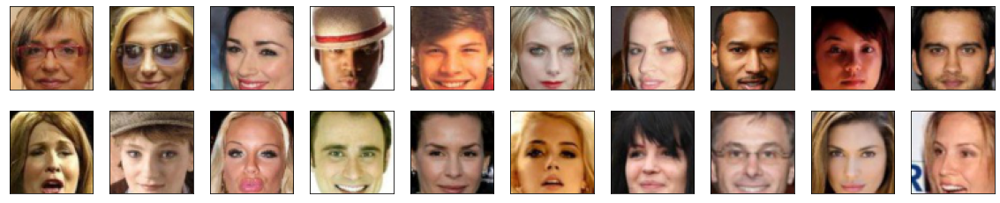

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
import torch.nn as nn

In [94]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        conv_dim = 32
        kernel_size = 4
        neg_slope = 0.2
        
        # No batch norm when using gradient penalty
        
        self.model = nn.Sequential(
            # Backbone
            # 64x64 in
            nn.Conv2d(in_channels = 3, out_channels = conv_dim, kernel_size = kernel_size, stride=2, padding=1, bias=False),
            nn.LeakyReLU(neg_slope),
            # 32x32 out
            nn.Conv2d(in_channels = conv_dim, out_channels = conv_dim*2, kernel_size = kernel_size, stride=2, padding=1, bias=False),
            nn.LeakyReLU(neg_slope),
            # 16x16 out
            nn.Conv2d(in_channels = conv_dim*2, out_channels = conv_dim*4, kernel_size = kernel_size, stride=2, padding=1, bias=False),
            nn.LeakyReLU(neg_slope),
            # 8x8 out
            nn.Conv2d(in_channels = conv_dim*4, out_channels = conv_dim*8, kernel_size = kernel_size, stride=2, padding=1, bias=False),
            nn.LeakyReLU(neg_slope),
            # 4x4 out

            # Head
            nn.Flatten(),
            nn.Linear(conv_dim*8*4*4, 1),
        )
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        # Need to unsqueeze 2 more dimensions to satisfy the Generator latent vec req
        return torch.unsqueeze(torch.unsqueeze(self.model(x), 2),3)

In [95]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [96]:
class Generator(nn.Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        
        kernel_size = 4
        conv_dim = 32

        self.model = nn.Sequential(
            nn.ConvTranspose2d(in_channels = latent_dim, out_channels = conv_dim*8, kernel_size = kernel_size, stride = 1, padding = 0, bias=False),
            nn.BatchNorm2d(conv_dim*8),
            nn.ReLU(),
            # 4x4 out

            nn.ConvTranspose2d(in_channels = conv_dim*8, out_channels = conv_dim*4, kernel_size = kernel_size, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(conv_dim*4),
            nn.ReLU(),
            # 8x8 out

            nn.ConvTranspose2d(in_channels = conv_dim*4, out_channels = conv_dim*2, kernel_size = kernel_size, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(conv_dim*2),
            nn.ReLU(),
            # 16x16 out

            nn.ConvTranspose2d(in_channels = conv_dim*2, out_channels = conv_dim, kernel_size = kernel_size, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(conv_dim),
            nn.ReLU(),
            # 32x32 out

            nn.ConvTranspose2d(in_channels = conv_dim, out_channels = 3, kernel_size = kernel_size, stride = 2, padding = 1, bias=False),
            nn.Tanh(),
            # 64x64 out
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        return self.model(x)


In [97]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [121]:
import torch.optim as optim


def create_optimizers(generator: nn.Module, discriminator: nn.Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers

    # params
    lr = 0.001
    beta1=0.5
    beta2=0.999 # default value

    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [122]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    
    # Apply Wasserstein loss: expected value of the discriminator distribution when discriminating fake images
    return -fake_logits.mean()

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

Optimization objective with Wasserstein loss:

<center>$\min_{g} \max_{d} E(d(x)) - E(d(g(z)))$</center>

In [123]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    
    # Apply Wasserstein loss: expected value of the discriminator distribution on real and fake images
    return -real_logits.mean() + fake_logits.mean()

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

We want to enforce the following condition on the discriminator loss:

<center>$|| \frac{dL_d}{dx} || < 1$</center>

In [124]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces that the gradient of the discriminator loss with respect to the inputs is less than 1 """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    
    # Uniformly sample the fake and real set
    N = real_samples.shape[0]
    real_sample = torch.unsqueeze(real_samples[np.random.randint(N)], 0)
    fake_sample = torch.unsqueeze(fake_samples[np.random.randint(N)], 0)
        
    # sample a random point between both distributions
    alpha = torch.rand(real_sample.shape).to(device)
    x_hat = alpha * real_sample + (1 - alpha) * fake_sample
        
    # calculate the gradient
    x_hat.requires_grad = True
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, 
                               x_hat, 
                               grad_outputs=torch.ones_like(pred), 
                               create_graph=True)[0]
    
    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1)**2).mean()    
    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [125]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    
    g_optimizer.zero_grad()

    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().to(device)
    fake_images = generator(z)

    # Compute loss
    D_fake = discriminator(fake_images)
    g_loss = generator_loss(D_fake)

    # Back propagation
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)

    d_optimizer.zero_grad()

    # Discriminate real images
    D_real = discriminator(real_images)

    # Generate fake images and discriminate
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().to(device)
    fake_images = generator(z)
    # We can detach because we don't need to back-propagate into the generator
    D_fake = discriminator(fake_images.detach())

    # Compute loss
    # Do not detach because we need the gradient for GP
    gp = gradient_penalty(discriminator, real_images, fake_images.detach())
    d_loss = discriminator_loss(D_real, D_fake) + gp_coef*gp
    
    # Back propagate
    d_loss.backward()
    d_optimizer.step()

    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [126]:
from datetime import datetime

In [127]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 10

# number of images in each batch
batch_size = 64

# gradient-penalty coef
gp_coef = 10

In [128]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [129]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-09-30 02:48:34 | Epoch [1/10] | Batch 0/509 | d_loss: 9.7068 | g_loss: 0.1935
2024-09-30 02:48:38 | Epoch [1/10] | Batch 50/509 | d_loss: -2.4638 | g_loss: -0.0120
2024-09-30 02:48:42 | Epoch [1/10] | Batch 100/509 | d_loss: -1.5418 | g_loss: 25.2171
2024-09-30 02:48:45 | Epoch [1/10] | Batch 150/509 | d_loss: -2.2122 | g_loss: -25.9380
2024-09-30 02:48:49 | Epoch [1/10] | Batch 200/509 | d_loss: -4.4567 | g_loss: 0.2860
2024-09-30 02:48:53 | Epoch [1/10] | Batch 250/509 | d_loss: -3.2700 | g_loss: 4.6037
2024-09-30 02:48:57 | Epoch [1/10] | Batch 300/509 | d_loss: -5.6874 | g_loss: 18.1632
2024-09-30 02:49:00 | Epoch [1/10] | Batch 350/509 | d_loss: -3.4318 | g_loss: 5.8282
2024-09-30 02:49:04 | Epoch [1/10] | Batch 400/509 | d_loss: -5.1219 | g_loss: -11.0533
2024-09-30 02:49:08 | Epoch [1/10] | Batch 450/509 | d_loss: -3.1039 | g_loss: 10.1726
2024-09-30 02:49:12 | Epoch [1/10] | Batch 500/509 | d_loss: -5.7798 | g_loss: 11.3266


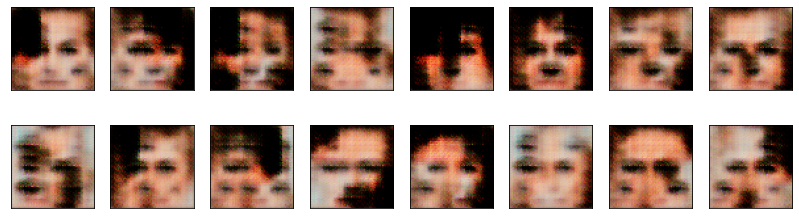

2024-09-30 02:49:15 | Epoch [2/10] | Batch 0/509 | d_loss: -5.8727 | g_loss: 7.7288
2024-09-30 02:49:19 | Epoch [2/10] | Batch 50/509 | d_loss: -10.0504 | g_loss: 18.5759
2024-09-30 02:49:23 | Epoch [2/10] | Batch 100/509 | d_loss: -6.3418 | g_loss: 2.8998
2024-09-30 02:49:27 | Epoch [2/10] | Batch 150/509 | d_loss: -5.2895 | g_loss: 10.2620
2024-09-30 02:49:31 | Epoch [2/10] | Batch 200/509 | d_loss: -6.6014 | g_loss: 4.8613
2024-09-30 02:49:35 | Epoch [2/10] | Batch 250/509 | d_loss: -7.4239 | g_loss: 8.2124
2024-09-30 02:49:38 | Epoch [2/10] | Batch 300/509 | d_loss: -6.0753 | g_loss: 7.6900
2024-09-30 02:49:42 | Epoch [2/10] | Batch 350/509 | d_loss: -6.8569 | g_loss: -21.1557
2024-09-30 02:49:46 | Epoch [2/10] | Batch 400/509 | d_loss: -3.4972 | g_loss: 6.2295
2024-09-30 02:49:50 | Epoch [2/10] | Batch 450/509 | d_loss: -6.6301 | g_loss: -9.5046
2024-09-30 02:49:53 | Epoch [2/10] | Batch 500/509 | d_loss: -5.6166 | g_loss: 23.5851


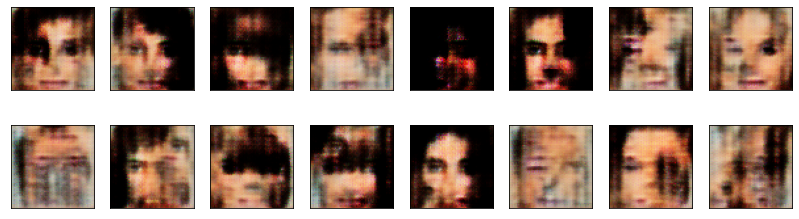

2024-09-30 02:49:58 | Epoch [3/10] | Batch 0/509 | d_loss: -4.7299 | g_loss: 0.7598
2024-09-30 02:50:01 | Epoch [3/10] | Batch 50/509 | d_loss: -4.3194 | g_loss: 6.4000
2024-09-30 02:50:05 | Epoch [3/10] | Batch 100/509 | d_loss: -5.1819 | g_loss: 1.7994
2024-09-30 02:50:09 | Epoch [3/10] | Batch 150/509 | d_loss: -5.0098 | g_loss: -6.4678
2024-09-30 02:50:12 | Epoch [3/10] | Batch 200/509 | d_loss: -2.4592 | g_loss: -2.0619
2024-09-30 02:50:16 | Epoch [3/10] | Batch 250/509 | d_loss: -0.1758 | g_loss: -8.4910
2024-09-30 02:50:19 | Epoch [3/10] | Batch 300/509 | d_loss: -2.4701 | g_loss: -10.6959
2024-09-30 02:50:23 | Epoch [3/10] | Batch 350/509 | d_loss: -1.2151 | g_loss: 7.0848
2024-09-30 02:50:26 | Epoch [3/10] | Batch 400/509 | d_loss: -4.0549 | g_loss: -1.3392
2024-09-30 02:50:30 | Epoch [3/10] | Batch 450/509 | d_loss: -4.3946 | g_loss: -35.6668
2024-09-30 02:50:34 | Epoch [3/10] | Batch 500/509 | d_loss: -3.1943 | g_loss: -1.8246


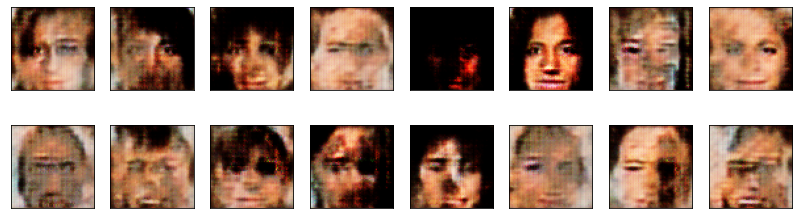

2024-09-30 02:50:37 | Epoch [4/10] | Batch 0/509 | d_loss: -4.2295 | g_loss: -0.1753
2024-09-30 02:50:41 | Epoch [4/10] | Batch 50/509 | d_loss: -2.1180 | g_loss: 7.9091
2024-09-30 02:50:45 | Epoch [4/10] | Batch 100/509 | d_loss: -3.8022 | g_loss: -18.9960
2024-09-30 02:50:49 | Epoch [4/10] | Batch 150/509 | d_loss: -2.7713 | g_loss: -3.0150
2024-09-30 02:50:53 | Epoch [4/10] | Batch 200/509 | d_loss: -1.6206 | g_loss: -10.6476
2024-09-30 02:50:56 | Epoch [4/10] | Batch 250/509 | d_loss: -2.9506 | g_loss: 12.1016
2024-09-30 02:51:00 | Epoch [4/10] | Batch 300/509 | d_loss: -4.4582 | g_loss: -10.7715
2024-09-30 02:51:03 | Epoch [4/10] | Batch 350/509 | d_loss: -0.3042 | g_loss: -2.6607
2024-09-30 02:51:07 | Epoch [4/10] | Batch 400/509 | d_loss: -3.8220 | g_loss: 6.4223
2024-09-30 02:51:10 | Epoch [4/10] | Batch 450/509 | d_loss: -2.2344 | g_loss: -3.2449
2024-09-30 02:51:14 | Epoch [4/10] | Batch 500/509 | d_loss: -3.5392 | g_loss: -4.8004


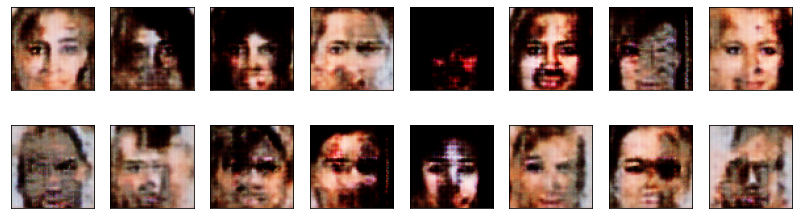

2024-09-30 02:51:18 | Epoch [5/10] | Batch 0/509 | d_loss: -2.2415 | g_loss: 2.4747
2024-09-30 02:51:22 | Epoch [5/10] | Batch 50/509 | d_loss: -4.1624 | g_loss: 1.8660
2024-09-30 02:51:25 | Epoch [5/10] | Batch 100/509 | d_loss: -1.9342 | g_loss: -2.8701
2024-09-30 02:51:29 | Epoch [5/10] | Batch 150/509 | d_loss: -2.6621 | g_loss: -3.3720
2024-09-30 02:51:32 | Epoch [5/10] | Batch 200/509 | d_loss: -2.4578 | g_loss: -17.2766
2024-09-30 02:51:36 | Epoch [5/10] | Batch 250/509 | d_loss: -4.4296 | g_loss: -16.2060
2024-09-30 02:51:40 | Epoch [5/10] | Batch 300/509 | d_loss: -3.4796 | g_loss: 5.6425
2024-09-30 02:51:43 | Epoch [5/10] | Batch 350/509 | d_loss: -2.4399 | g_loss: 4.5168
2024-09-30 02:51:47 | Epoch [5/10] | Batch 400/509 | d_loss: -3.0015 | g_loss: -1.5447
2024-09-30 02:51:50 | Epoch [5/10] | Batch 450/509 | d_loss: -3.1506 | g_loss: 4.6890
2024-09-30 02:51:54 | Epoch [5/10] | Batch 500/509 | d_loss: -2.7284 | g_loss: -1.8206


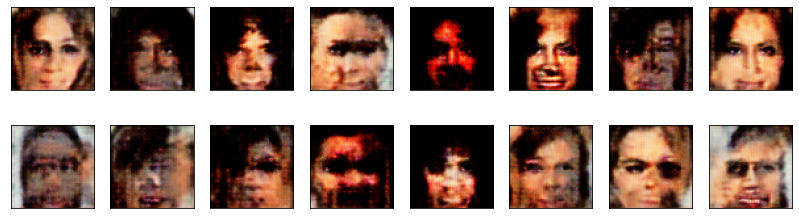

2024-09-30 02:51:58 | Epoch [6/10] | Batch 0/509 | d_loss: -3.0174 | g_loss: 7.6396
2024-09-30 02:52:02 | Epoch [6/10] | Batch 50/509 | d_loss: -2.1711 | g_loss: -5.6573
2024-09-30 02:52:06 | Epoch [6/10] | Batch 100/509 | d_loss: -2.9256 | g_loss: -0.9980
2024-09-30 02:52:09 | Epoch [6/10] | Batch 150/509 | d_loss: -3.6739 | g_loss: 4.5462
2024-09-30 02:52:13 | Epoch [6/10] | Batch 200/509 | d_loss: -2.2121 | g_loss: -2.6828
2024-09-30 02:52:17 | Epoch [6/10] | Batch 250/509 | d_loss: -2.7693 | g_loss: 9.6924
2024-09-30 02:52:20 | Epoch [6/10] | Batch 300/509 | d_loss: -2.9884 | g_loss: 0.5185
2024-09-30 02:52:24 | Epoch [6/10] | Batch 350/509 | d_loss: -4.6155 | g_loss: 11.0329
2024-09-30 02:52:27 | Epoch [6/10] | Batch 400/509 | d_loss: -2.1918 | g_loss: 18.8917
2024-09-30 02:52:31 | Epoch [6/10] | Batch 450/509 | d_loss: -2.3136 | g_loss: 0.0533
2024-09-30 02:52:35 | Epoch [6/10] | Batch 500/509 | d_loss: -2.0432 | g_loss: -14.9966


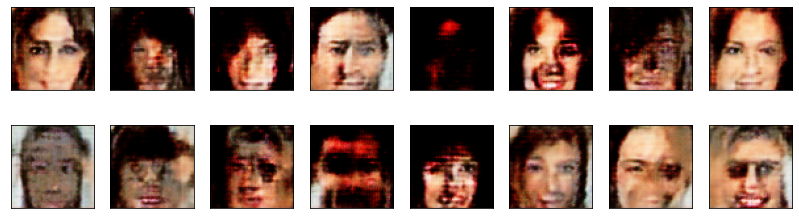

2024-09-30 02:52:38 | Epoch [7/10] | Batch 0/509 | d_loss: -2.0373 | g_loss: 17.5868
2024-09-30 02:52:42 | Epoch [7/10] | Batch 50/509 | d_loss: -1.0819 | g_loss: -13.2412
2024-09-30 02:52:46 | Epoch [7/10] | Batch 100/509 | d_loss: -4.1696 | g_loss: -22.3092
2024-09-30 02:52:49 | Epoch [7/10] | Batch 150/509 | d_loss: -4.3272 | g_loss: -7.6708
2024-09-30 02:52:53 | Epoch [7/10] | Batch 200/509 | d_loss: -3.2708 | g_loss: -15.4878
2024-09-30 02:52:57 | Epoch [7/10] | Batch 250/509 | d_loss: -2.1897 | g_loss: -16.1307
2024-09-30 02:53:00 | Epoch [7/10] | Batch 300/509 | d_loss: -2.2305 | g_loss: -4.4842
2024-09-30 02:53:04 | Epoch [7/10] | Batch 350/509 | d_loss: -1.8483 | g_loss: -8.4155
2024-09-30 02:53:08 | Epoch [7/10] | Batch 400/509 | d_loss: -2.5090 | g_loss: 11.1215
2024-09-30 02:53:11 | Epoch [7/10] | Batch 450/509 | d_loss: -3.1788 | g_loss: 25.1457
2024-09-30 02:53:15 | Epoch [7/10] | Batch 500/509 | d_loss: -2.4921 | g_loss: 13.0415


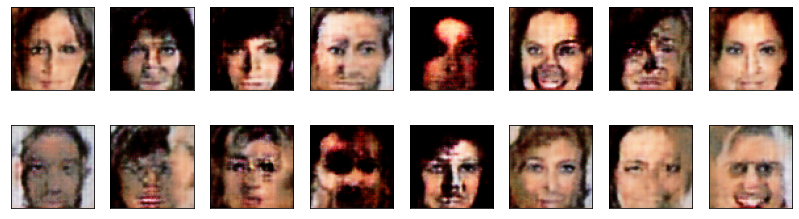

2024-09-30 02:53:19 | Epoch [8/10] | Batch 0/509 | d_loss: -1.8448 | g_loss: -8.0318
2024-09-30 02:53:23 | Epoch [8/10] | Batch 50/509 | d_loss: -1.2940 | g_loss: -0.5871
2024-09-30 02:53:27 | Epoch [8/10] | Batch 100/509 | d_loss: -2.9805 | g_loss: 26.8636
2024-09-30 02:53:31 | Epoch [8/10] | Batch 150/509 | d_loss: -0.2542 | g_loss: 3.1099
2024-09-30 02:53:34 | Epoch [8/10] | Batch 200/509 | d_loss: -0.7950 | g_loss: 2.7791
2024-09-30 02:53:38 | Epoch [8/10] | Batch 250/509 | d_loss: -2.8597 | g_loss: 39.9833
2024-09-30 02:53:42 | Epoch [8/10] | Batch 300/509 | d_loss: -1.4319 | g_loss: 7.5050
2024-09-30 02:53:46 | Epoch [8/10] | Batch 350/509 | d_loss: 1.4912 | g_loss: 2.3024
2024-09-30 02:53:49 | Epoch [8/10] | Batch 400/509 | d_loss: -2.3913 | g_loss: 5.3441
2024-09-30 02:53:53 | Epoch [8/10] | Batch 450/509 | d_loss: -0.9602 | g_loss: 3.3487
2024-09-30 02:53:57 | Epoch [8/10] | Batch 500/509 | d_loss: -2.2506 | g_loss: 24.3760


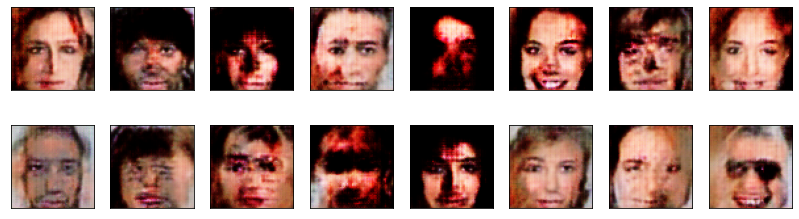

2024-09-30 02:54:01 | Epoch [9/10] | Batch 0/509 | d_loss: -2.4244 | g_loss: -24.2392
2024-09-30 02:54:05 | Epoch [9/10] | Batch 50/509 | d_loss: -1.2931 | g_loss: 4.0452
2024-09-30 02:54:09 | Epoch [9/10] | Batch 100/509 | d_loss: -2.0332 | g_loss: 19.1191
2024-09-30 02:54:13 | Epoch [9/10] | Batch 150/509 | d_loss: -2.0597 | g_loss: 22.8168
2024-09-30 02:54:16 | Epoch [9/10] | Batch 200/509 | d_loss: -2.7287 | g_loss: 17.5683
2024-09-30 02:54:20 | Epoch [9/10] | Batch 250/509 | d_loss: 0.1827 | g_loss: -5.6651
2024-09-30 02:54:24 | Epoch [9/10] | Batch 300/509 | d_loss: -2.0986 | g_loss: 2.9422
2024-09-30 02:54:27 | Epoch [9/10] | Batch 350/509 | d_loss: -3.0746 | g_loss: 32.3010
2024-09-30 02:54:31 | Epoch [9/10] | Batch 400/509 | d_loss: -2.7779 | g_loss: -10.2826
2024-09-30 02:54:35 | Epoch [9/10] | Batch 450/509 | d_loss: -0.8536 | g_loss: -12.4448
2024-09-30 02:54:38 | Epoch [9/10] | Batch 500/509 | d_loss: -2.8403 | g_loss: -3.6487


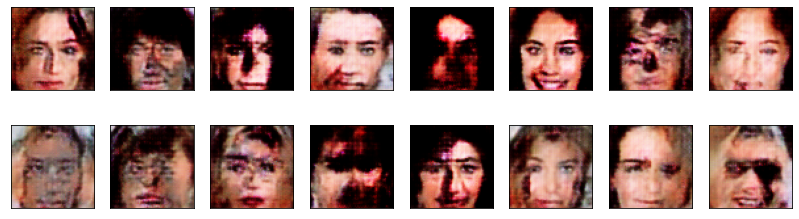

2024-09-30 02:54:42 | Epoch [10/10] | Batch 0/509 | d_loss: -1.1721 | g_loss: 10.4603
2024-09-30 02:54:46 | Epoch [10/10] | Batch 50/509 | d_loss: -2.4983 | g_loss: 7.7297
2024-09-30 02:54:49 | Epoch [10/10] | Batch 100/509 | d_loss: -1.8090 | g_loss: 6.4548
2024-09-30 02:54:53 | Epoch [10/10] | Batch 150/509 | d_loss: -1.2940 | g_loss: 28.7673
2024-09-30 02:54:56 | Epoch [10/10] | Batch 200/509 | d_loss: -0.8382 | g_loss: 4.2083
2024-09-30 02:55:00 | Epoch [10/10] | Batch 250/509 | d_loss: -1.5381 | g_loss: -14.4119
2024-09-30 02:55:04 | Epoch [10/10] | Batch 300/509 | d_loss: 0.0507 | g_loss: -0.1876
2024-09-30 02:55:07 | Epoch [10/10] | Batch 350/509 | d_loss: 0.8006 | g_loss: -0.4178
2024-09-30 02:55:11 | Epoch [10/10] | Batch 400/509 | d_loss: -2.2526 | g_loss: 12.8029
2024-09-30 02:55:15 | Epoch [10/10] | Batch 450/509 | d_loss: -0.5572 | g_loss: 1.0141
2024-09-30 02:55:19 | Epoch [10/10] | Batch 500/509 | d_loss: -2.8276 | g_loss: 22.0076


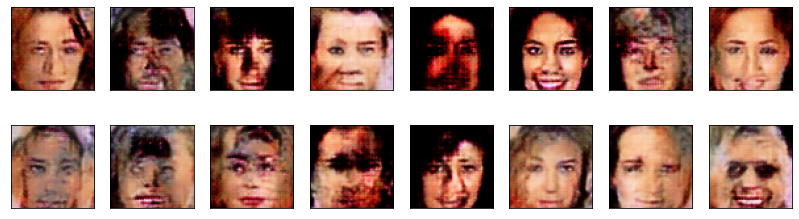

In [130]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy

        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        g_loss = generator_step(batch_size, latent_dim)

        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

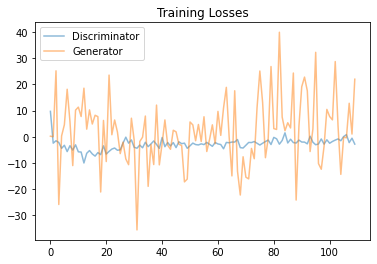

In [131]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.